# Nano GPT

In [1]:
def download_dataset():
    !curl -o tiny_shakespeare.txt https://raw.githubusercontent.com/karpathy/char-rnn/master/data/tinyshakespeare/input.txt

download_dataset()

  % Total    % Received % Xferd  Average Speed   Time    Time     Time  Current
                                 Dload  Upload   Total   Spent    Left  Speed
100 1089k  100 1089k    0     0  1410k      0 --:--:-- --:--:-- --:--:-- 1409k


In [2]:
dataset_filepath = "tiny_shakespeare.txt"
with open(dataset_filepath, 'r', encoding='utf-8') as f:
    text = f.read()

print("Length of dataset in characters: ", len(text))
print("First 1000 characters: ", text[:1000])

Length of dataset in characters:  1115394
First 1000 characters:  First Citizen:
Before we proceed any further, hear me speak.

All:
Speak, speak.

First Citizen:
You are all resolved rather to die than to famish?

All:
Resolved. resolved.

First Citizen:
First, you know Caius Marcius is chief enemy to the people.

All:
We know't, we know't.

First Citizen:
Let us kill him, and we'll have corn at our own price.
Is't a verdict?

All:
No more talking on't; let it be done: away, away!

Second Citizen:
One word, good citizens.

First Citizen:
We are accounted poor citizens, the patricians good.
What authority surfeits on would relieve us: if they
would yield us but the superfluity, while it were
wholesome, we might guess they relieved us humanely;
but they think we are too dear: the leanness that
afflicts us, the object of our misery, is as an
inventory to particularise their abundance; our
sufferance is a gain to them Let us revenge this with
our pikes, ere we become rakes: for the gods k

In [3]:
chars = sorted(list(set(text)))
vocab_size = len(chars)
print(f"Characters (vocabulary): [{''.join(chars)}]")
print("Vocabulary Size: ", vocab_size)

Characters (vocabulary): [
 !$&',-.3:;?ABCDEFGHIJKLMNOPQRSTUVWXYZabcdefghijklmnopqrstuvwxyz]
Vocabulary Size:  65


In [4]:
# Create a mapping from characters to integrers
str_to_int = {ch : i for i, ch in enumerate(chars)}
int_to_str = {i : ch for i, ch, in enumerate(chars)}
encode = lambda x: [str_to_int[c] for c in x]
decode = lambda x: ''.join([int_to_str[i] for i in x])

print(encode("hello world"))
print(decode(encode("hello world")))

# Note: We can also use sub-word unit tokenizers for more advanced tokenization
# - Google: SentencePiece - https://github.com/google/sentencepiece
# - OpenAI: TikToken - https://github.com/openai/tiktoken
#
# More tokens means shorter sequences but larger codebooks

[46, 43, 50, 50, 53, 1, 61, 53, 56, 50, 42]
hello world


In [5]:
# Encode entire text dataset and store it in a torch.Tensor
import torch
data = torch.tensor(encode(text), dtype=torch.long)
print(f"Data shape: {data.shape}, data type: {data.dtype}")
print(f"First 1000 tokens fed to GPT will look like this: {data[:1000]}")

Data shape: torch.Size([1115394]), data type: torch.int64
First 1000 tokens fed to GPT will look like this: tensor([18, 47, 56, 57, 58,  1, 15, 47, 58, 47, 64, 43, 52, 10,  0, 14, 43, 44,
        53, 56, 43,  1, 61, 43,  1, 54, 56, 53, 41, 43, 43, 42,  1, 39, 52, 63,
         1, 44, 59, 56, 58, 46, 43, 56,  6,  1, 46, 43, 39, 56,  1, 51, 43,  1,
        57, 54, 43, 39, 49,  8,  0,  0, 13, 50, 50, 10,  0, 31, 54, 43, 39, 49,
         6,  1, 57, 54, 43, 39, 49,  8,  0,  0, 18, 47, 56, 57, 58,  1, 15, 47,
        58, 47, 64, 43, 52, 10,  0, 37, 53, 59,  1, 39, 56, 43,  1, 39, 50, 50,
         1, 56, 43, 57, 53, 50, 60, 43, 42,  1, 56, 39, 58, 46, 43, 56,  1, 58,
        53,  1, 42, 47, 43,  1, 58, 46, 39, 52,  1, 58, 53,  1, 44, 39, 51, 47,
        57, 46, 12,  0,  0, 13, 50, 50, 10,  0, 30, 43, 57, 53, 50, 60, 43, 42,
         8,  1, 56, 43, 57, 53, 50, 60, 43, 42,  8,  0,  0, 18, 47, 56, 57, 58,
         1, 15, 47, 58, 47, 64, 43, 52, 10,  0, 18, 47, 56, 57, 58,  6,  1, 63,
        53, 

In [6]:
# Let's now divide the data into train and validation sets
training_share = int(0.9*len(data))
train_data = data[:training_share]
val_data = data[training_share:]

In [7]:
# We're not going to feed the entire dataset into the model all at once since that would be computationally expensive and lead
# to overfitting. Instead, we'll randomly sample small contiguous chunks of the dataset, and train the model on those chunks one
# at a time. The input (i.e. the "chunk") will be a k-length stream of tokens and the output will be the {k+1}th token as defined
# in the training dataset.
#
# In other words, the training objective for the model is to predict the {k+1}th token as a function
# of the {k} previous tokens as defined in the training dataset.
#
# We'll refer to this value {k} as the "block size". Others also refer to it as the "context length".
# We'll start with a relatively small block size of 8.

block_size = 8
print(f"First block in training data: {train_data[:block_size + 1]}")

First block in training data: tensor([18, 47, 56, 57, 58,  1, 15, 47, 58])


In [8]:
# When training with a block size of size {k}, we have not just 1 batch of input-output pairs, but rather {k} batches.
# This is because we train the model on input streams of sizes 1, 2, ..., {k}. Thus, we have input-output pairs:
# {
#   ([train_data[:1]], train_data[1]),
#   ([train_data[:2]], train_data[2]),
#   ([train_data[:3]], train_data[3]),
#   ...
#   ([train_data[:k]], train_data[k])
# }
# This technique of training the model on variable size blocks up to length {k} ensures that the model will perform well
# on input streams of up to {k} tokens, and not just on input streams of {k} tokens specifically.

x = train_data[:block_size]
y = train_data[1:block_size + 1]
for t in range(block_size):
    context = x[:t + 1]
    target = y[t]
    print(f"when input is {context} the target is {target}")

when input is tensor([18]) the target is 47
when input is tensor([18, 47]) the target is 56
when input is tensor([18, 47, 56]) the target is 57
when input is tensor([18, 47, 56, 57]) the target is 58
when input is tensor([18, 47, 56, 57, 58]) the target is 1
when input is tensor([18, 47, 56, 57, 58,  1]) the target is 15
when input is tensor([18, 47, 56, 57, 58,  1, 15]) the target is 47
when input is tensor([18, 47, 56, 57, 58,  1, 15, 47]) the target is 58


In [9]:
# (A) Full-batch gradient descent:
# 1. For every example in the dataset, do forward inference and compute the loss
# 2. Compute the mean loss over examples
# 3. Using the mean loss, apply the gradient update via backpropagation
#
# (B) Single-example stochastic gradient descent
# 1. Randomly sample a single input from the dataset
# 2. Execute forward inference for this sample and compute the loss
# 3. Using the loss, apply the gradient update via backpropagation
#
# - Note that this is called stochastic gradient descent (SGD) because it replaces the actual gradient (calculated from the entire
#   dataset) with an estimate thereof (calculated from a randomly selected subset of the whole dataset).
#
# (C) Mini-batch stochastic gradient descent
# - Same as full-batch gradient descent, except we execute forward inference on a strict subset of the whole dataset before applying
#    backpropagation. The subset size is referred to as the "batch size".
# 1. For {batch_size} < N examples in the training set, do forward inference and compute the loss (where {N} is full dataset size)
# 2. Compute the mean loss over the {batch_size} examples
# 3. Using the mean loss, apply the gradient update via backpropagation
#
# Problems with option (A):
# - (i)   the model will take a very slow time to convergence and
# - (ii)  the model may overfit the training data since the same set of data is used to compute the loss before the gradient
#         update via backpropagation.
# Problems with option (B):
# - (i)   the model may quickly overfit a small subset of the data if the learning rate is too large, therefore requiring much
#         more careful tuning of the learning rate
# - (ii)  the training process is also much more computationally intensive than the other two options since backpropagation is
#         run individually for every training example - and backpropagation is the bottleneck in model training
# - (iii) the fact that backpropagation is not run for every training example also means that the training procedure is not
#         amenable to parallel processing, and this further raises the computational intensiveness of training
#
# For these reasons, we'll go with option (C) - minbatch processing. We can take advantage of the parallel processing capabilities
# of GPUs to reduce training duration.

torch.manual_seed(1337)
batch_size = 4
block_size = 8

def get_batch(split, batch_size=batch_size, block_size=block_size):
    # generate a minibatch of data of inputs {x} and targets {y}
    data = train_data if split == 'train' else val_data
    ix = torch.randint(len(data) - block_size, (batch_size,))  # get {batch_size} index sequences of length {block_size} each
    x = torch.stack([data[i : i + block_size] for i in ix])
    y = torch.stack([data[i+1 : i+block_size+1] for i in ix])
    return x, y

xb, yb = get_batch('train')
print(f"Inputs shape: {xb.shape}, inputs: {xb}")
print(f"Outputs shape: {yb.shape}, outputs: {yb}")
print("----")

for b in range(batch_size):  # batch dimension
    for t in range(block_size):  # 'time' or 'context length' dimension
        context = xb[b, :t + 1]
        target = yb[b, t]
        print(f"[batch {b}] when input is {context.tolist()} the target is: {target}")

Inputs shape: torch.Size([4, 8]), inputs: tensor([[24, 43, 58,  5, 57,  1, 46, 43],
        [44, 53, 56,  1, 58, 46, 39, 58],
        [52, 58,  1, 58, 46, 39, 58,  1],
        [25, 17, 27, 10,  0, 21,  1, 54]])
Outputs shape: torch.Size([4, 8]), outputs: tensor([[43, 58,  5, 57,  1, 46, 43, 39],
        [53, 56,  1, 58, 46, 39, 58,  1],
        [58,  1, 58, 46, 39, 58,  1, 46],
        [17, 27, 10,  0, 21,  1, 54, 39]])
----
[batch 0] when input is [24] the target is: 43
[batch 0] when input is [24, 43] the target is: 58
[batch 0] when input is [24, 43, 58] the target is: 5
[batch 0] when input is [24, 43, 58, 5] the target is: 57
[batch 0] when input is [24, 43, 58, 5, 57] the target is: 1
[batch 0] when input is [24, 43, 58, 5, 57, 1] the target is: 46
[batch 0] when input is [24, 43, 58, 5, 57, 1, 46] the target is: 43
[batch 0] when input is [24, 43, 58, 5, 57, 1, 46, 43] the target is: 39
[batch 1] when input is [44] the target is: 53
[batch 1] when input is [44, 53] the target is

In [10]:
# Bigram Embedding Layer
# Embedding layers are used to encode and learn more associative representations between tokens
import torch
import torch.nn as nn
from torch.nn import functional as F
torch.manual_seed(1337)

class BigramLanguageModel(nn.Module):
    def __init__(self, vocab_size):
        super().__init__()
        # num_embeddings x embedding_dim
        # num_embeddings -> size of the dictionary of embeddings
        # embedding_dim  -> size of each embedding vector
        self.token_embedding_table = nn.Embedding(vocab_size, vocab_size)

    def forward(self, idx, targets=None):
        # (context length, num_embeddings) x (num_embeddings, embedding_dim)
        # => logits = (context length, embedding_dim)
        logits = self.token_embedding_table(idx)

        if targets is None:
            # we're in test time and not training time, so no loss is needed
            loss = None
        else:
            # batch x context length x embedding dim
            # context length -> T (for number of time steps or tokens)
            # embedding dim  -> C (for number of channels per embedding vector)
            B, T, C = logits.shape
            logits = logits.view(B*T, C)
            targets = targets.view(B*T)

            # This is called a Bigram model since the input at index `i` in the context legnth input is
            # compared to the output at the same index `i` in the targets when computing the loss
            # And the target and index `i` is simply the context length input at index `i+1`
            # No long-range historical dependencies are applied
            loss = F.cross_entropy(logits, targets)

        return logits, loss


    def generate(self, idx, max_new_tokens):
        # idx is (B, T) array of indices in the current context
        for _ in range(max_new_tokens):
            # forward inference for predictions and loss
            logits, loss = self(idx)
            # focus only on the last time step (input) by reshaping from (B, T, C) -> (B, C)
            logits = logits[:, -1, :]
            # apply softmax to get probabilities from logits
            probs = F.softmax(logits, dim=-1)
            # sample from the generated disribution to get the next token. shape is (B, 1)
            idx_next = torch.multinomial(probs, num_samples=1)
            # append sampled index to the running sequence
            idx = torch.cat((idx, idx_next), dim=1) # (B, T+1)

        return idx


bigram_model = BigramLanguageModel(vocab_size)
logits, loss = bigram_model(xb, yb)

print(f"Input shape: {xb.shape}: {xb.shape[0]} batches of context length {xb.shape[1]} inputs")
print(f"Targets shape: {yb.shape}: {yb.shape[0]} batches length {yb.shape[1]} outputs")
print(f"Logits shape: {logits.shape}, Loss: {loss.shape}")
print(f"Loss: {loss}")

def generate_tokens(max_new_tokens=100):
    idx = torch.zeros((1, 1), dtype=torch.long)
    new_tokens = bigram_model.generate(idx, max_new_tokens=max_new_tokens)[0].tolist()
    return decode(new_tokens)

print(generate_tokens(100))

Input shape: torch.Size([4, 8]): 4 batches of context length 8 inputs
Targets shape: torch.Size([4, 8]): 4 batches length 8 outputs
Logits shape: torch.Size([32, 65]), Loss: torch.Size([])
Loss: 4.878634929656982

Sr?qP-QWktXoL&jLDJgOLVz'RIoDqHdhsV&vLLxatjscMpwLERSPyao.qfzs$Ys$zF-w,;eEkzxjgCKFChs!iWW.ObzDnxA Ms$3


In [11]:
# Training
# Create a Pytorch optimizer
optimizer = torch.optim.AdamW(bigram_model.parameters(), lr=1e-3)

In [12]:
batch_size = 32             # we're redifining the batch size here from 4 to 32
for steps in range(10000):
    # sample a batch of data
    xb, yb = get_batch('train')

    # evaluate the loss
    logits, loss = bigram_model(xb, yb)
    optimizer.zero_grad(set_to_none=True)
    loss.backward()
    optimizer.step()

print(loss.item())

2.4212486743927


Some text here

In [13]:
print(generate_tokens(1000))


KIZ!

we?
W$d he k
MIV;


IETyoZY st:


Gheay Yatondgrende'TEQUNathinin: ans nd s

OREre.
Qhour im, sof bn I's temrpe thithattersuravWhefe h antr forgg m walos nt kit mo RLORZ'd IFknyor!
Sindis prewhous oodod.
wouprebe bll:CUNTHUSt

Thleaix;
Malesheais whe; lino.
ALI;
CXdaimboth,
batly, tyous w F nig har-
ASerin livin ad:
GRveitho wond ve ack'
3'd gat held inghe beromUCOFFoce ?Y's.
Pat fe, healcofoan.
FXgrnk3ffstoncetasollar dir ce s:

FGS OXELEurdo the horer mf IOP,-W?ENe,
LIDbor d,

CUSY: CKr t k the, averofithanontowbr boute, antorg ithe,
Dndill d,loworathalichothazLINothipr sowserll!-bee be y VObe, st,
U'l, ifrenit w fo-ber, OFo berad wit t w$itenepUING?cofe Win.
Cudsce kelind seail, is.
ARJathee p st; YNbs rld pr, auf tauth ny l bar:
cee hes ndetasuse

Ino'&ckinthe Wre tan; anu be, mZSEYQumbu wengboitor wismabe dat
IUN:
AUNoveed'stathemy;D:
wel batyamiPves;
LIthe hat b, ooly ingr w, th ar foumyo s ere fomswouf lSJu r f II ot wen rknge oorenn m ho w Sie l, amaveve a?Bu p nyoncllol

In [14]:
@torch.no_grad
def estimate_loss():
    out = {}
    bigram_model.eval()
    for split in ['train', 'val']:
        losses = torch.zeros(eval_iters)
        for k in range(eval_iters):
            X, Y = get_batch(split)
            logits, loss = bigram_model(X, Y)
            losses[k] = loss.item()
        out[split] = losses.mean()
    bigram_model.train()
    return out


## The Mathematical Trick in Self Attention

In [15]:
# We want to create an input vector that incorporates context about previous tokens at every time step T]
#
# That is, given input vector x := [x_1, ..., x_n], we want to create a vector f(x) such that
#   f(x) = [f_1(x_1), f_2(x_1, x_2), f_3(x_1, x_2, x_3), ..., f_n(x_1, ..., x_n)]
# where
#   f_{i}: R^i -> R
#
# The idea is that f_{i} communicates context about all tokens up to time step {i}. The simplest such function
# f{i} is probably just the mean function:
#
#  f_{i} := mean(x_1, ..., x_i)
#
# and so we'll use that as the initial function to demonstrate self-attention

torch.manual_seed(1337)
B, T, C = 4, 8, 2
x = torch.randn(B, T, C)
x.shape

# Mean function for self-attention
def mean_self_attention(x):
    xbow = torch.zeros((B, T, C))
    for b in range(B):
        for t in range(T):
            xprev = x[b, :t+1]
            xbow[b, t] = torch.mean(xprev, 0)
    return xbow

xbow = mean_self_attention(x)
print('Mean Self Attention')
print(x[0])
print(xbow[0])

# Even though above computation of the mean works, it's very inefficient due to the double for-loop
# We can speed up the computation by relying on matrix multiplication to parallelise the computations
# The mathematical trick is that we can use a lower triangular matrix of ones to efficiently compute the
# means of every time step.

torch.manual_seed(42)
def mean_self_attention_with_tril(x):
    index_matrix = torch.tril(torch.ones(T, T))
    xbow = index_matrix @ x
    xbow /= torch.sum(index_matrix, dim=1, keepdim=True)
    return xbow

xbow = mean_self_attention_with_tril(x)
print('Mean Self Attention with Lower Triangular Matrix')
print(x[0])
print(xbow[0])

# It's also worth mentioning that another way of producing the above matrix is to use a masked fill on the
# lower triangular matrix, followed by a softmax operation. The masked fill sets all the zero elements in
# the LT matrix to '-inf' and the softmax operation averages out the exponentiated values of all elements
# in a row.

def mean_self_attention_with_tril_and_softmax(x):
    index_matrix = torch.tril(torch.ones(T, T))
    index_matrix = index_matrix.masked_fill(index_matrix == 0, float('-inf'))
    index_matrix = F.softmax(index_matrix, dim=-1)
    xbow = index_matrix @ x
    return xbow

xbow = mean_self_attention_with_tril_and_softmax(x)
print('Mean Self Attention with Lower Triangular Matrix and Softmax')
print(x[0])
print(xbow[0])

# The use of lower triangular matrices here is not just for efficiency - they are previewing the two fundamental
# ideas behind self attention:
# - first, that the future can't communicate with the past, and
# - second, that through matrix multiplication of a lower triangular fashion, we can do weighted aggregations of
#   past elements and use the activations of these elements to condition the activations of future elements


Mean Self Attention
tensor([[ 0.1808, -0.0700],
        [-0.3596, -0.9152],
        [ 0.6258,  0.0255],
        [ 0.9545,  0.0643],
        [ 0.3612,  1.1679],
        [-1.3499, -0.5102],
        [ 0.2360, -0.2398],
        [-0.9211,  1.5433]])
tensor([[ 0.1808, -0.0700],
        [-0.0894, -0.4926],
        [ 0.1490, -0.3199],
        [ 0.3504, -0.2238],
        [ 0.3525,  0.0545],
        [ 0.0688, -0.0396],
        [ 0.0927, -0.0682],
        [-0.0341,  0.1332]])
Mean Self Attention with Lower Triangular Matrix
tensor([[ 0.1808, -0.0700],
        [-0.3596, -0.9152],
        [ 0.6258,  0.0255],
        [ 0.9545,  0.0643],
        [ 0.3612,  1.1679],
        [-1.3499, -0.5102],
        [ 0.2360, -0.2398],
        [-0.9211,  1.5433]])
tensor([[ 0.1808, -0.0700],
        [-0.0894, -0.4926],
        [ 0.1490, -0.3199],
        [ 0.3504, -0.2238],
        [ 0.3525,  0.0545],
        [ 0.0688, -0.0396],
        [ 0.0927, -0.0682],
        [-0.0341,  0.1332]])
Mean Self Attention with Lower 

In [16]:
# Recall the two fundamental ideas behind self-attention:
# - first, that the future can't communicate with the past, and
# - second, that through matrix multiplication of a lower triangular fashion, we can do weighted aggregations of
#   past elements and use the activations of these elements to condition the activations of future elements
#
# In a previous example, we used the mean function to communicate this dependency.
# The problem with this approach is that it doesn't communicate the affinities between specific tokens in a
# "data-dependent" manner. And what do we mean by "data-dependent"?
#
# Suppose a model is being trained on a dataset of English text. Suppose also that the text is tokenised by character.
# It may be the case that in this dataset, the 3 tokens prior to any vowel are each more likely to be a consonant
# than a vowel. We want to capture this ("inductive" or "implicit") dependency between tokens while training the
# model. Mean averaging is too imprecise to solve this problem. Self-attention, however, provides us a solution.
#
# The idea is that in a self-attention head, every token (0 <= t < T) emits three vectors: a "query", "key" and "value"
#
# Roughly speaking:
# - The "query" vector is saying: "what am I looking for?"
# - The "key" vector is saying:   "what do I contain?"
# - The "value" vector is saying: "if you find me interesting, here's what I will communicate to you"
#
# The self-attention head then takes the dot product between every "query" and "key" vector. Indices in the dot
# product that have high activations represent strong data-dependent affinities between tokens. This output
# matrix is then multiplied with the "value" vector to communicate these affinities to the subsequent layer
# during the forward pass to the previous layer during backpropagation.

torch.manual_seed(1337)
B, T, C = 4, 8, 32
x = torch.randn(B, T, C)

# self-attention head
head_size = 16           # size of key and query vectors each
key   = nn.Linear(C, head_size, bias=False)
query = nn.Linear(C, head_size, bias=False)
value = nn.Linear(C, head_size, bias=False)

k_val = key(x)   # (B, T, 16)
q_val = query(x) # (B, T, 16)
v_val = value(x)
wei   = q_val @ k_val.transpose(-2, -1)  # (B, T, 16) @ (B, 16, T) -> (B, T, T)

tril = torch.tril(torch.ones(T, T))
wei = wei.masked_fill(tril == 0, float('-inf'))
wei = F.softmax(wei, dim=-1)
print(wei[0])
out = wei @ v_val
out.shape

tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.1574, 0.8426, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.2088, 0.1646, 0.6266, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.5792, 0.1187, 0.1889, 0.1131, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0294, 0.1052, 0.0469, 0.0276, 0.7909, 0.0000, 0.0000, 0.0000],
        [0.0176, 0.2689, 0.0215, 0.0089, 0.6812, 0.0019, 0.0000, 0.0000],
        [0.1691, 0.4066, 0.0438, 0.0416, 0.1048, 0.2012, 0.0329, 0.0000],
        [0.0210, 0.0843, 0.0555, 0.2297, 0.0573, 0.0709, 0.2423, 0.2391]],
       grad_fn=<SelectBackward0>)


torch.Size([4, 8, 16])

tensor([[1.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.1574, 0.8426, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.2088, 0.1646, 0.6266, 0.0000, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.5792, 0.1187, 0.1889, 0.1131, 0.0000, 0.0000, 0.0000, 0.0000],
        [0.0294, 0.1052, 0.0469, 0.0276, 0.7909, 0.0000, 0.0000, 0.0000],
        [0.0176, 0.2689, 0.0215, 0.0089, 0.6812, 0.0019, 0.0000, 0.0000],
        [0.1691, 0.4066, 0.0438, 0.0416, 0.1048, 0.2012, 0.0329, 0.0000],
        [0.0210, 0.0843, 0.0555, 0.2297, 0.0573, 0.0709, 0.2423, 0.2391]],
       grad_fn=<SelectBackward0>)


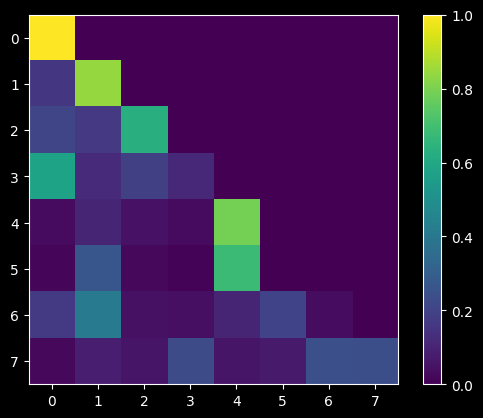

In [17]:
# To demonstrate the affinities between token, we can also plot the output TxT matrix as a heatmap.
# Notice that the upper-triangular segment of the heatmap is all 0 since information is only propagated
# from the previous tokens to the current token.

import matplotlib.pyplot as plt
import numpy as np
plt.style.use('dark_background')


def plot_tensor(tensor, title=None):
  """Plots a tensor as a heatmap."""

  if title is not None:
    plt.title(title)
  plt.imshow(tensor.cpu().detach().numpy(), cmap='viridis')
  plt.colorbar()
  plt.show()

# Example usage:
# Assuming you have a tensor named 'wei' (or any other tensor you want to plot)
print(wei[0])
plot_tensor(wei[0])

**Notes:** Self-attention can be considered as a communication mechanism. We have a number of nodes (tokens) in a semi-complete directed graph with weighted edges, where the weighted edges communicate the influence of one token on another.

We call the graph "semi-complete" because only previous tokens have influence on the current token, and so the only edges that exist are those from the current token to previous tokens and the current token.

The weights of the edges are data-dependent, meaning that  the edge weights are dependent on the training data.

Second, notice that there is no notion of "space". Attention acts only over a set of vectors, so tokens must be positionally encoded.

Third, "scaled" attention divides the weights matrix "wei" by the square root of the head size, "sqrt(head_size)". This is an important normalization step: it ensures that when Q (query) and K (key) matrices are of unit variance, "wei" will also be of unit variance. This ensures that the softmax outputs will remain diffuse and reduce the likelihood of saturation. Example below:

In [18]:
# 'torch.randn' Returns a tensor filled with random numbers from a normal distribution with
# mean 0 and variance 1 (also called the standard normal distribution).
k = torch.randn(B, T, head_size)
q = torch.randn(B, T, head_size)
wei_unnormalized = q @ k.transpose(-2, -1)
print(f"K variance: {k.var()}")
print(f"Q variance: {q.var()}")

# Recall that for two random variables X and Y, Var[X + Y] = Var[X] + Var[Y] + 2(E[XY]- E[X]E[Y])
# So since E[X] and E[Y] both equal 0 when X and Y are independently sampled from N(0, 1), we have
# Var[X + Y] = Var[X] + Var[Y].
# So, for 16 random variables X_1, ..., X_16 sampled from N(0, 1), we expect that:
#  Var[X_1 + ... X_16] = Var[X_1] + ... Var[X_16] = 16 * Var[X_1] = 16 (since Var[X_i] = 1 for all 1 <= i <= 16).

print(f"Wei unnormalized variance: {wei_unnormalized.var()}")

wei = q @ k.transpose(-2, -1) * head_size ** -0.5
print(f"Wei normalized variance: {wei.var()}")

K variance: 1.044861912727356
Q variance: 1.0700464248657227
Wei unnormalized variance: 17.46897315979004
Wei normalized variance: 1.0918108224868774


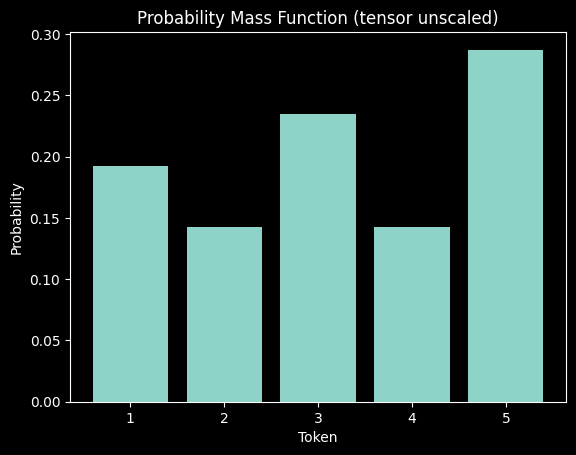

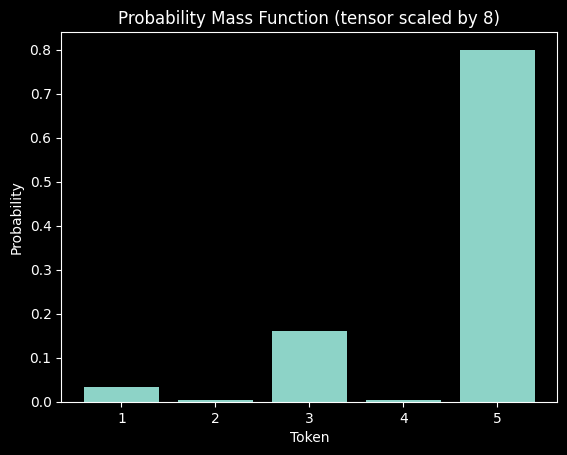

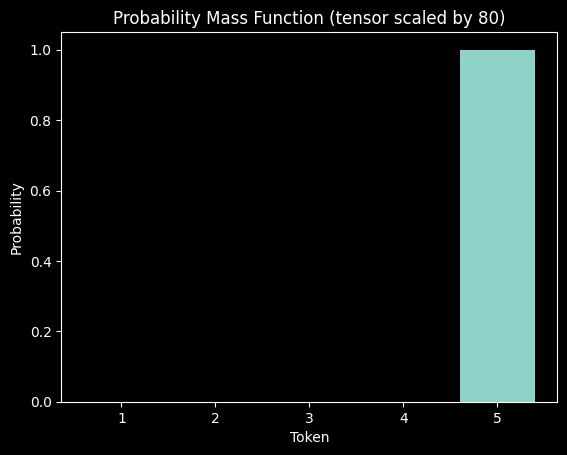

In [19]:
# In addition, normalizing the variance is important to ensure that information is aggregated from
# all tokens in each of the {T} attention vectors in the output weight matrix, and not just one node
# in each vector.
#
# To see why this is the case, recall the definition of the softmax operation:
#
#   σ(z_i) = exp(z_i) / ∑_{j=1}^K exp(z_j)
#
#   Where:
#
#     z is a vector of the output of the network
#     K is the number of classes in the output
#
#   In our case, z ∈ ℝ^T and K := T since the output weights are a TxT grid representing affinities between tokens.
#
# Since d(exp(z_i))/d(z_i) = exp(z_i). And since exp: ℝ -> ℝ is a monotonically increasing function, larger variances
# will cause the softmax function to saturate. And this in turn, will ensure that information is aggregated from only
# one element in the vector during both the forward pass and backpropagation.
#
# We demonstrate this below:

softmax_unnormalized = torch.softmax(torch.tensor([0.1, -0.2, 0.3, -0.2, 0.5]), dim=-1)
softmax_scaled1 = torch.softmax(torch.tensor([0.1, -0.2, 0.3, -0.2, 0.5]) * 8, dim=-1)
softmax_scaled2 = torch.softmax(torch.tensor([0.1, -0.2, 0.3, -0.2, 0.5]) * 80, dim=-1)

# prompt: Plot a graph of a probability mass function

import matplotlib.pyplot as plt
import numpy as np
plt.style.use('dark_background')

def plot_pmf(probabilities, title_description):
    """Plots a vector as a probability mass function"""
    x = np.arange(1, len(probabilities) + 1)
    plt.bar(x, probabilities)
    plt.xlabel("Token")
    plt.ylabel("Probability")
    plt.title(f"Probability Mass Function ({title_description})")
    plt.show()

plot_pmf(softmax_unnormalized, "tensor unscaled")
plot_pmf(softmax_scaled1, "tensor scaled by 8")
plot_pmf(softmax_scaled2, "tensor scaled by 80")

In [20]:
class Head(nn.Module):
    """One head of self-attention"""

    def __init__(self, head_size):
        super().__init__()
        self.key   = nn.Linear(C, head_size, bias=False)
        self.query = nn.Linear(C, head_size, bias=False)
        self.value = nn.Linear(C, head_size, bias=False)
        self.register_buffer('tril', torch.tril(torch.ones(block_size, block_size)))
        self.attention_weights = None

    def forward(self, x):
        B, T, C = x.shape
        k = self.key(x)    # (B, T, 16)
        q = self.query(x)  # (B, T, 16)
        v = self.value(x)  # (B, T, 16)
        wei = q @ k.transpose(-2, -1) * (C ** -0.5)  # (B, T, 16) @ (B, 16, T) -> (B, T, T)

        # Take the TxT lower triangular matrix, self.tril[:T, :T], and for the indices where the value equals 0,
        # replace the same indices in the 'wei' matrix with the value '-inf'.
        wei = wei.masked_fill(self.tril[:T, :T] == 0, float('-inf'))

        # Apply softmax to get the logits
        wei = F.softmax(wei, dim=-1)

        # Store the attention tensor so that it can be visualised over the course of training
        self.attention_weights = wei.detach().cpu()

        # Multiply the logits matrix by the value matrix to get the output representation for each token based on the
        # importance weights encoded in the logits matrix.
        out = wei @ v  # (B, T, T) @ (B, T, C) -> (B, T, C)
        return out



## Bigram Language Model with Self-Attention

BigramLanguageModelWithAttention(
  (token_embedding_table): Embedding(65, 32)
  (position_embedding_table): Embedding(8, 32)
  (sa_head): Head(
    (key): Linear(in_features=32, out_features=32, bias=False)
    (query): Linear(in_features=32, out_features=32, bias=False)
    (value): Linear(in_features=32, out_features=32, bias=False)
  )
  (lm_head): Linear(in_features=32, out_features=65, bias=True)
)
-----------------------
step 0: train loss 4.2165
⬇︎ Attention Weights ⬇︎


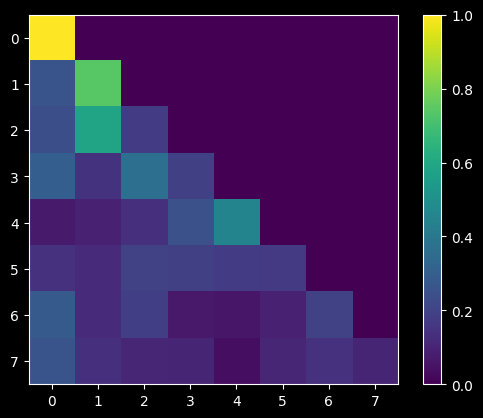

-----------------------
step 500: train loss 2.5847
⬇︎ Attention Weights ⬇︎


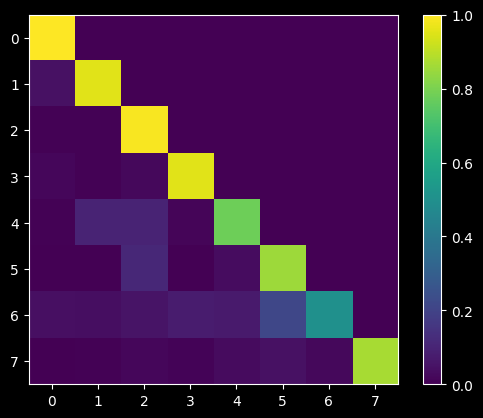

-----------------------
step 1000: train loss 2.7676
⬇︎ Attention Weights ⬇︎


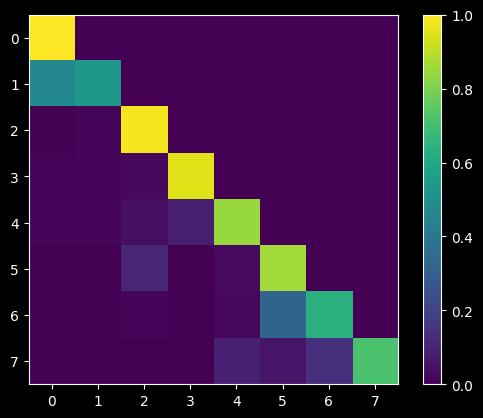

-----------------------
step 1500: train loss 2.5267
⬇︎ Attention Weights ⬇︎


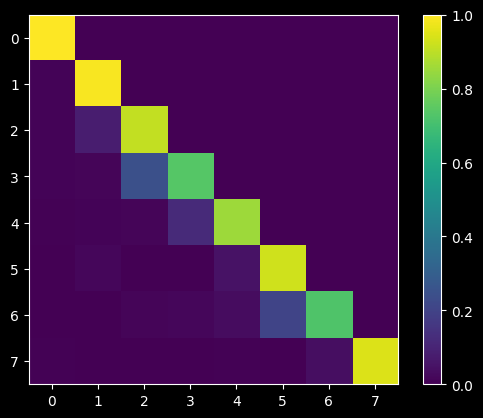

-----------------------
step 2000: train loss 2.3875
⬇︎ Attention Weights ⬇︎


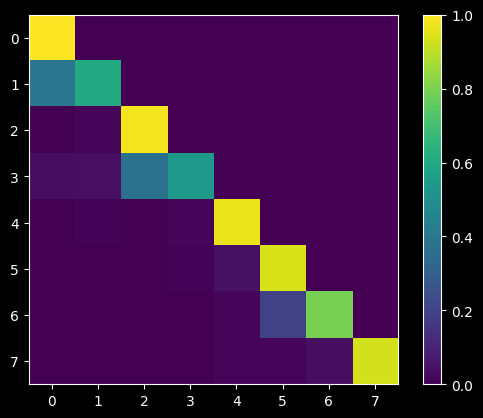

-----------------------
step 2500: train loss 2.3357
⬇︎ Attention Weights ⬇︎


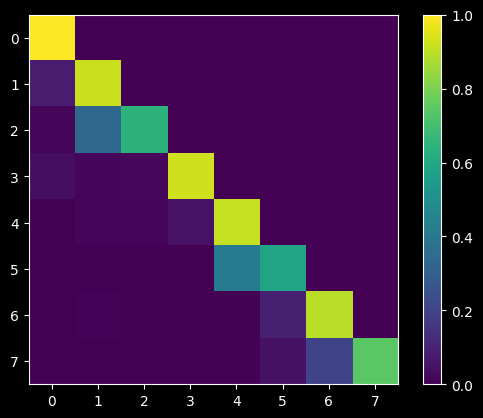

-----------------------
step 3000: train loss 2.3474
⬇︎ Attention Weights ⬇︎


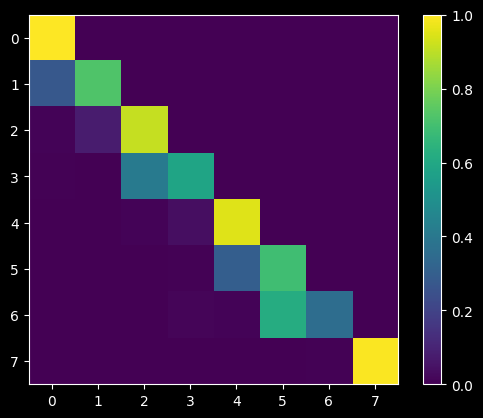

-----------------------
step 3500: train loss 2.4571
⬇︎ Attention Weights ⬇︎


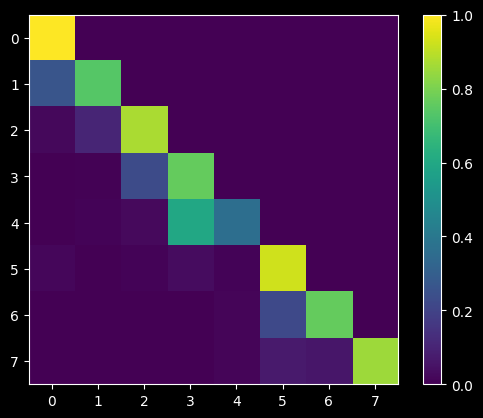

-----------------------
step 4000: train loss 2.3297
⬇︎ Attention Weights ⬇︎


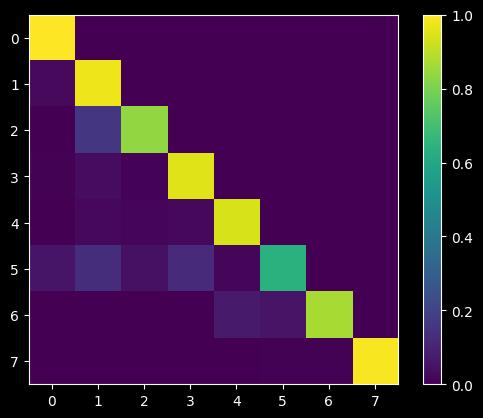

-----------------------
step 4500: train loss 2.3823
⬇︎ Attention Weights ⬇︎


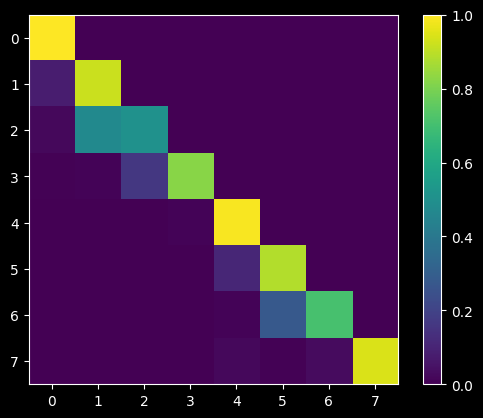


MTIONELANING forealsitorut HRnk Kge when tcouce, do pr thitanof ang:
Kay no shergalten, meseveminds se tendortingin ies to higthhito aste ndechea nor br
Hed hy senIn rmy a theint do mas ind yan benke imyol menat mlinorfe eing brwimapisel hawe epin I, is;
Sa dst hay'silll wheramperel lalsp!
AT:

ollactest juea ds: to, thr urth?

Sh Hes mas, he it ily.

The.

Ptir Whoundlll onvey meras be:
He
Gar ndonbust Ret Et,
HAnveaboel I noungale ithe nu to me winerte yom tlel!
Hisiss yie ot,
Bu arnd olers eterins; sis kes souk ble-d Rars, es spant th tholkave, scee Cis othes
et fiwheresed wer ris ilreve my acld.

IUOR: Eok TK hpatry hipr.


'INIWHAncken rwoun. ar?

ET: Bur, gist athe coufr hir, byoras o'd;

Thathese hawcor hernd en:
Bur wifloutr st ma than:
Hr:
Wive! wito amonge,
Goul, tald weat rere wincof inol ga oro!

CUK: I litherower lifl he pues foour out ars:
A ourer:
An:
Pan:ur woury pmour, mand avense tr JHan dto, nce st o, Jihes wpat nel:
I wis shown'ed.

MAnd at, his ote hthe wongo ad w

In [27]:
# Below we create a Bigram model that uses self-attention. The model presented is an evolution of the Bigram model
# presented earlier


class BigramLanguageModelWithAttention(nn.Module):
    def __init__(self, vocab_size, embedding_dim, device):
        super().__init__()

        # Device
        self.device = device

        # num_embeddings x embedding_dim
        # num_embeddings -> size of the dictionary of embeddings
        # embedding_dim  -> size of each embedding vector
        # num_embeddings here equals vocab_size

        # each token is associated with a unique embedding vector
        self.token_embedding_table = nn.Embedding(vocab_size, embedding_dim)

        # each position in the context is associated with a unique embedding vector
        self.position_embedding_table = nn.Embedding(block_size, embedding_dim)

        # Self-attention head
        self.sa_head = Head(embedding_dim)

        # Language model head
        self.lm_head = nn.Linear(embedding_dim, vocab_size)



    def forward(self, idx, targets=None):
        B, T = idx.shape

        # (context length, vocab_size) x (vocab_size, embedding_dim)
        # => token_emb = (context length, embedding_dim)
        # (context length, embedding_dim) x (embedding_dim, vocab_size)
        # => logits    = (context length, vocab_size)
        #
        # Note that 'context length' := block_size
        #
        # Note also, that before being fed into any embedding layer, every token is converted into a one-hot vector
        # of size 'vocab_size' in the background, to determine which embedding vector should be emitted. This is
        # why we represent the input to the embedding layer as (context length, vocab_size) rather than (context length, 1).
        token_emb = self.token_embedding_table(idx)  # (B, T, C)
        pos_emb   = self.position_embedding_table(torch.arange(T, device=self.device))  # (T, C)
        x = token_emb + pos_emb   # (B, T, C)
        x = self.sa_head(x)  # (B, T, C)
        logits = self.lm_head(x)  # (B, T, vocab_size)

        if targets is None:
            # we're in test time and not training time, so no loss is needed
            loss = None
        else:
            # batch x context length x embedding dim
            # context length -> T (for number of time steps or tokens)
            # embedding dim  -> C (for number of channels per embedding vector)
            B, T, C = logits.shape
            logits = logits.view(B*T, C)
            targets = targets.view(B*T)

            # This is called a Bigram language model since the output logits for the token at index `t` (0 <= t < T)
            # are compared against the one-hot vector for the token at index `t+1`. In other words, the model is
            # being taught to predict token `t+1` based on token `t`. Even though long-range dependencies between
            # tokens are being captured by the self-attention head in preceding layers, the model is called a
            # "Bigram" language model because in the final layer, only the logits for token `t` are used in calculating
            # the loss.
            loss = F.cross_entropy(logits, targets)

        return logits, loss


    def generate(self, idx, max_new_tokens):
        # idx is (B, T) array of indices in the current context
        for _ in range(max_new_tokens):
            # crop 'idx' to the last 'block_size' tokens so that positional embedding does not go out of context
            idx_cond = idx[:, -block_size:]
            # forward inference for predictions and loss
            logits, loss = self(idx_cond)
            # focus only on the last time step (input) by reshaping from (B, T, C) -> (B, C)
            logits = logits[:, -1, :]
            # apply softmax to get probabilities from logits
            probs = F.softmax(logits, dim=-1)
            # sample from the generated disribution to get the next token. shape is (B, 1)
            idx_next = torch.multinomial(probs, num_samples=1)
            # append sampled index to the running sequence
            idx = torch.cat((idx, idx_next), dim=1) # (B, T+1)

        return idx

# hyperparameters
# - self-attention cannot tolerate very high learning rates
batch_size = 32
block_size = 8
max_iters = 5000
eval_interval = 500
learning_rate = 1e-3
device = 'cuda' if torch.cuda.is_available() else 'cpu'
eval_iters = 200
embedding_dim = 32

def train_model(model):
    # create a PyTorch optimizer
    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

    for step in range(max_iters):
        # sample a batch of data
        xb, yb = get_batch('train', batch_size, block_size)
        xb, yb = xb.to(device), yb.to(device)

        # evaluate the loss
        if step % eval_interval == 0:
            logits, loss = model(xb, yb)
        else:
            logits, loss = model(xb, yb)
        optimizer.zero_grad(set_to_none=True)
        loss.backward()
        optimizer.step()

        # print progress
        if step % eval_interval == 0:
            print("-----------------------")
            print(f"step {step}: train loss {loss:.4f}")
            attention_weights = model.sa_head.attention_weights
            print("⬇︎ Attention Weights ⬇︎")
            plot_tensor(attention_weights[0])

model = BigramLanguageModelWithAttention(vocab_size, embedding_dim, device)
model = model.to(device)
print(model)
train_model(model)

# To further visualize model performance, we generate some text to observe how well the model has learnt
def generate_tokens(model, max_new_tokens=100):
    idx = torch.zeros((1, 1), dtype=torch.long)
    idx = idx.to(device)
    new_tokens = model.generate(idx, max_new_tokens=max_new_tokens)[0].tolist()
    return decode(new_tokens)

print(generate_tokens(model, 1000))

{'': torch.Size([4, 8, 32]), 'key': torch.Size([4, 8, 32]), 'query': torch.Size([4, 8, 32]), 'value': torch.Size([4, 8, 32])}
 -> Head(
  (key): Linear(in_features=32, out_features=32, bias=False)
  (query): Linear(in_features=32, out_features=32, bias=False)
  (value): Linear(in_features=32, out_features=32, bias=False)
)
key -> Linear(in_features=32, out_features=32, bias=False)
query -> Linear(in_features=32, out_features=32, bias=False)
value -> Linear(in_features=32, out_features=32, bias=False)
torch.Size([4, 8, 8])


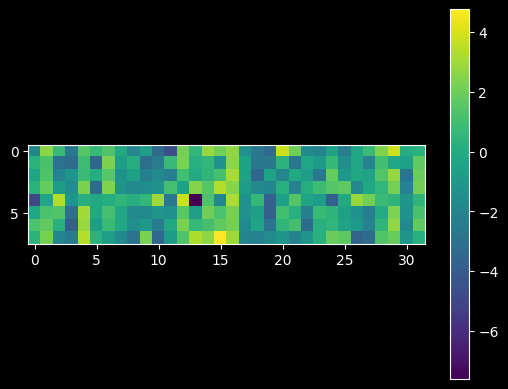

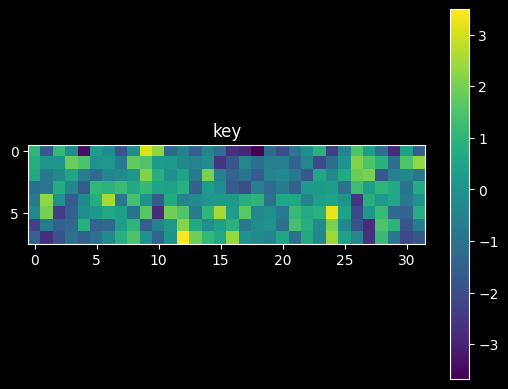

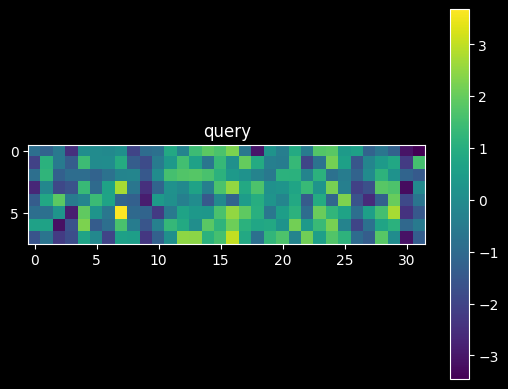

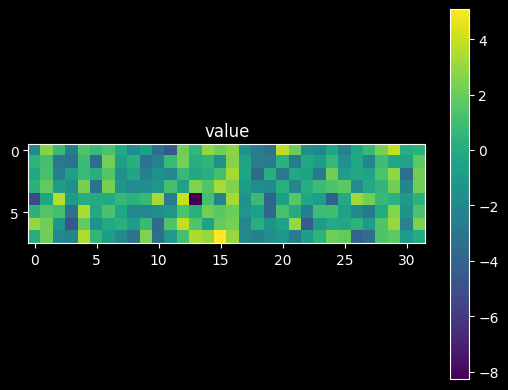

In [29]:
# Inspecting the various weights being learnt by the self-attention head over the course of training, allows us to visualise the affinities
# that are being learnt between tokens. We write a decorator here to accomplish this. The decorator works by installing a hook to extract
# all the named layers of the attention head.
#
# Note however, that the actual TxT attention weights matrix (probably the most informative matrix since it directly demonstrates token
# affinities) is better retrieved by calling:
#
#   self.model.sa_head.attention_weights
#
# since these attention weights are not represented as a Pytorch module/layer.
#
# Note that this direct retrieval mechanism requires us to save the attention weights on each forward pass (which is done in the attention
# 'Head' module).
from typing import Callable

class AttentionHeadWeightsExtractor(nn.Module):
    def __init__(self, model):
        super().__init__()
        self.model = model
        self._weights = {name : torch.empty(0) for name, _ in self.model.sa_head.named_modules()}

        # Register hook to fetch weights for each named layer
        for name, module in self.model.sa_head.named_modules():
            module.register_forward_hook(self.save_weights_hook(name))


    def save_weights_hook(self, module_name) -> Callable:
        def fn(_, __, output):
            self._weights[module_name] = output
        return fn

    def forward(self, x):
        x = x.to(self.model.device)
        _ = self.model(x)
        return self._weights


bigram_model_weights_extractor = AttentionHeadWeightsExtractor(model)
weights = bigram_model_weights_extractor(xb)
print({name : output.shape for name, output in weights.items()})

#for idx, module in enumerate(model.named_modules()):
#    print(idx, '->', module)

for name, module in model.sa_head.named_modules():
    print(name, '->', module)

print(model.sa_head.attention_weights.shape)

for name, output in weights.items():
    plot_tensor(output[0], name)

BigramLanguageModelWithMultiHeadAttention(
  (token_embedding_table): Embedding(65, 32)
  (position_embedding_table): Embedding(8, 32)
  (sa_heads): MultiHeadAttention(
    (heads): ModuleList(
      (0-3): 4 x Head(
        (key): Linear(in_features=32, out_features=8, bias=False)
        (query): Linear(in_features=32, out_features=8, bias=False)
        (value): Linear(in_features=32, out_features=8, bias=False)
      )
    )
  )
  (lm_head): Linear(in_features=32, out_features=65, bias=True)
)
-----------------------
step 0: train loss 4.2292
torch.Size([4, 8, 8])
⬇︎ Attention Weights ⬇︎


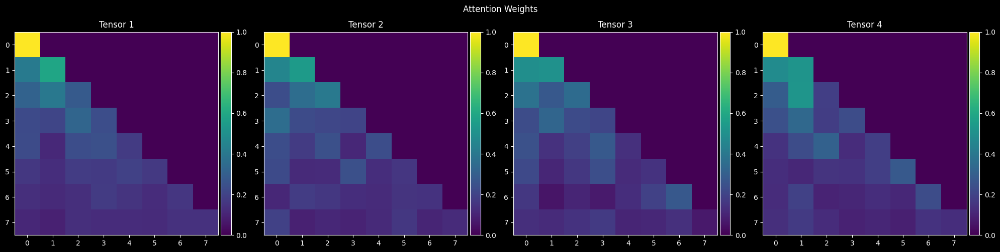

-----------------------
step 500: train loss 2.6582
torch.Size([4, 8, 8])
⬇︎ Attention Weights ⬇︎


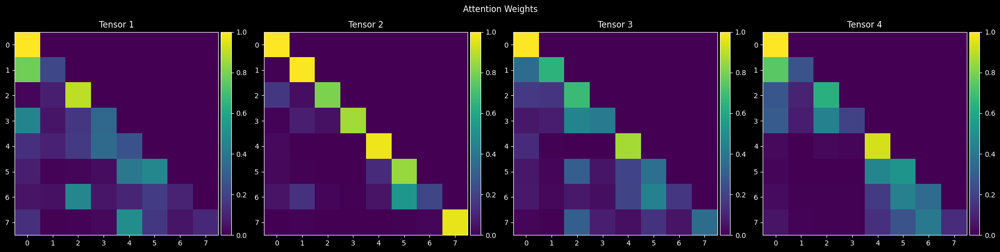

-----------------------
step 1000: train loss 2.5913
torch.Size([4, 8, 8])
⬇︎ Attention Weights ⬇︎


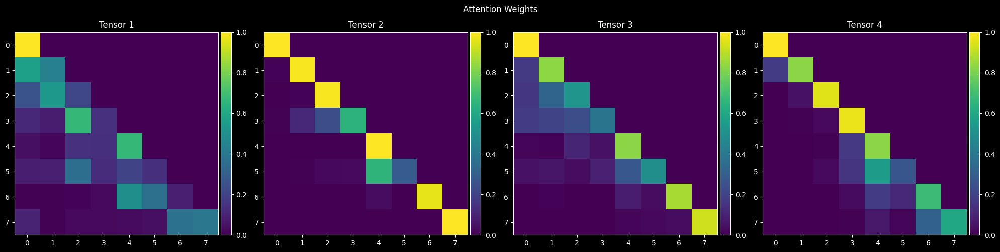

-----------------------
step 1500: train loss 2.3972
torch.Size([4, 8, 8])
⬇︎ Attention Weights ⬇︎


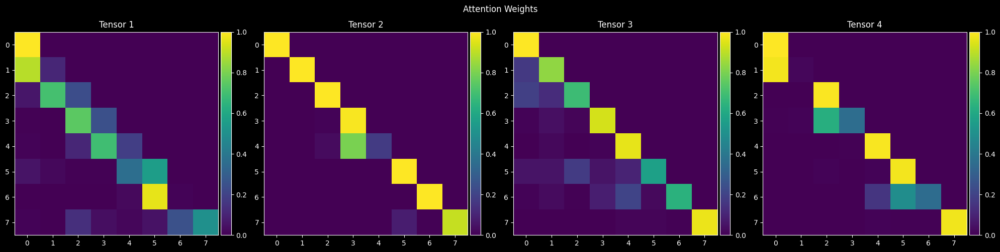

-----------------------
step 2000: train loss 2.2707
torch.Size([4, 8, 8])
⬇︎ Attention Weights ⬇︎


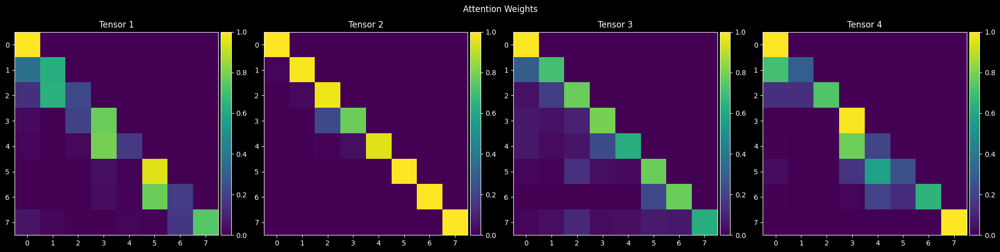

-----------------------
step 2500: train loss 2.1852
torch.Size([4, 8, 8])
⬇︎ Attention Weights ⬇︎


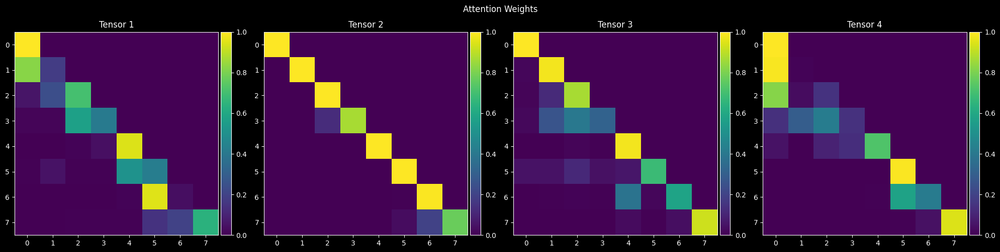

-----------------------
step 3000: train loss 2.2532
torch.Size([4, 8, 8])
⬇︎ Attention Weights ⬇︎


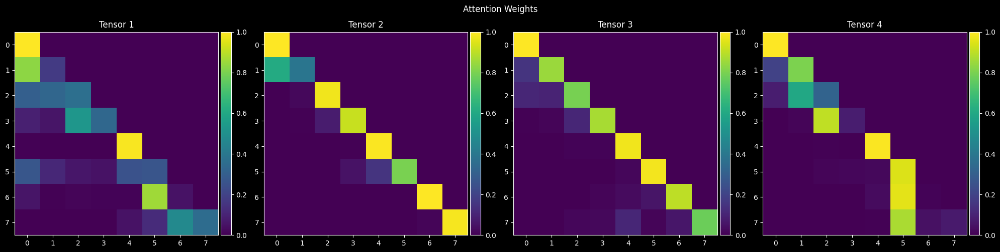

-----------------------
step 3500: train loss 2.2937
torch.Size([4, 8, 8])
⬇︎ Attention Weights ⬇︎


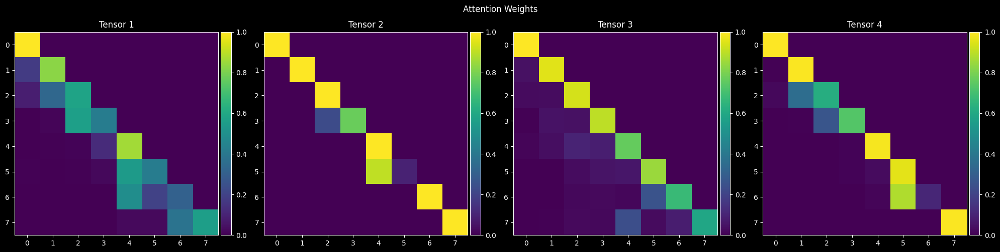

-----------------------
step 4000: train loss 2.3135
torch.Size([4, 8, 8])
⬇︎ Attention Weights ⬇︎


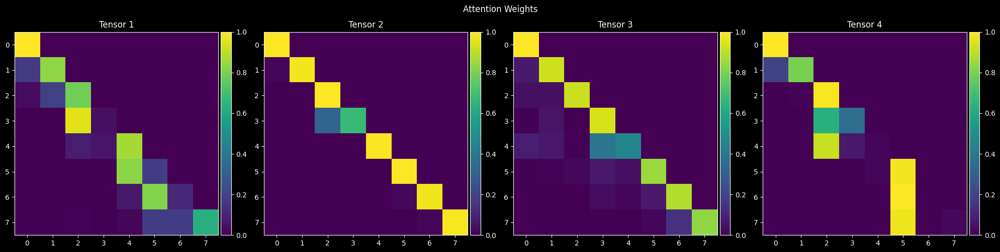

-----------------------
step 4500: train loss 2.2670
torch.Size([4, 8, 8])
⬇︎ Attention Weights ⬇︎


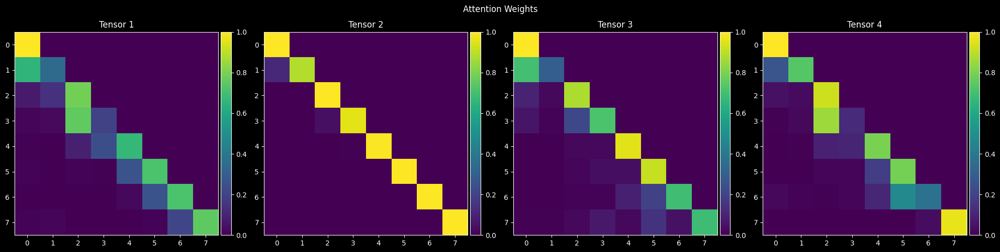


Be eelant.

3 say him lomy thaset you corgren.
Gram high t fassto gide,
A bat haedes.

BENTIUR:
Nou.
Cis tookie wel't Garl Secolove anet,
Cde,
Sall bsore of
Gloo, imis ith your
Thopuot not ad youortwand is cow
The mand hollk plend: core,
Lound
And bolfondssence! adreng lam nount whoult soass
Cow nequorley.

VARDUKE:
O mapurtuenie. Alds be.

Clicell ive thoust da my sis, the se. Well weare rers pan.

Ol bul I and my ther molllcig his tim,
Qore:
Herey,
And row hese slle fof oure mowto quurcesse of fise.
'll lat.
YAS:
As Vouve st, ve theime hou an geghtake.


Fome,
Andrienvy foll be ane wind, I I hay 'd the shatort boporirth.

SWrond eam. Whateer:
Nome of slour for bee padty me wer eisg eneclfill mancut;
Duls coth youus, have you rone kires wicend missse thidn:
Maith Hond, prre buty ghantre.
Cowht woand.

Rlegeayerm,
Ging!

NAUVENTIO:
ish gun in Dod tore: to ne, an Whe.
Ye.
you himand, husto pat sadre;
Nen brey athim be crings youllk'll we by to Rish, teat, rod ble'd, to I isterend,
And 

In [30]:
# One architectural extension of this self-attention head is "Multi-Head Attention". The idea behind Multi-Head attention is to apply
# multiple self-attention heads in parallel to learn more disentagled features within the same layer of the network. These features are
# then concantenated before feeding them to the next layer of the network. The concatenation operation ensures that these features
# remain disentangled by propagating them *in parellel* to one another.
#
# The number of matrix rows (for the next layer) remains directly proportional to the number of self-attention heads.
#
# Multi-head attention is very similar to group convolution

from mpl_toolkits.axes_grid1 import make_axes_locatable


class MultiHeadAttention(nn.Module):
    """Multiple heads of self-attention in parallel"""

    def __init__(self, num_heads, head_size):
        super().__init__()
        self.heads = nn.ModuleList([Head(head_size) for _ in range(num_heads)])

    def forward(self, x):
        return torch.cat([h(x) for h in self.heads], dim=-1)



class BigramLanguageModelWithMultiHeadAttention(nn.Module):
    def __init__(self, vocab_size, embedding_dim, device):
        super().__init__()
        # Device
        self.device = device

        # each token is associated with a unique embedding vector
        self.token_embedding_table = nn.Embedding(vocab_size, embedding_dim)

        # each position in the context is associated with a unique embedding vector
        self.position_embedding_table = nn.Embedding(block_size, embedding_dim)

        # Self-attention heads
        self.sa_heads = MultiHeadAttention(4, embedding_dim // 4)  # 4 heads of self-attention, each of dimension embedding_dim // 4

        # Language model head
        self.lm_head = nn.Linear(embedding_dim, vocab_size)



    def forward(self, idx, targets=None):
        B, T = idx.shape

        # (context length, vocab_size) x (vocab_size, embedding_dim)
        # => token_emb = (context length, embedding_dim)
        # (context length, embedding_dim) x (embedding_dim, vocab_size)
        # => logits    = (context length, vocab_size)
        #
        # Note that 'context length' := block_size
        #
        # Note also, that before being fed into any embedding layer, every token is converted into a one-hot vector
        # of size 'vocab_size' in the background, to determine which embedding vector should be emitted. This is
        # why we represent the input to the embedding layer as (context length, vocab_size) rather than (context length, 1).
        token_emb = self.token_embedding_table(idx)  # (B, T, C)
        pos_emb   = self.position_embedding_table(torch.arange(T, device=self.device))  # (T, C)
        x = token_emb + pos_emb   # (B, T, C)
        x = self.sa_heads(x)  # (B, T, C)
        logits = self.lm_head(x)  # (B, T, vocab_size)

        if targets is None:
            # we're in test time and not training time, so no loss is needed
            loss = None
        else:
            # batch x context length x embedding dim
            # context length -> T (for number of time steps or tokens)
            # embedding dim  -> C (for number of channels per embedding vector)
            B, T, C = logits.shape
            logits = logits.view(B*T, C)
            targets = targets.view(B*T)

            # This is called a Bigram language model since the output logits for the token at index `t` (0 <= t < T)
            # are compared against the one-hot vector for the token at index `t+1`. In other words, the model is
            # being taught to predict token `t+1` based on token `t`. Even though long-range dependencies between
            # tokens are being captured by the self-attention head in preceding layers, the model is called a
            # "Bigram" language model because in the final layer, only the logits for token `t` are used in calculating
            # the loss.
            loss = F.cross_entropy(logits, targets)

        return logits, loss


    def generate(self, idx, max_new_tokens):
        # idx is (B, T) array of indices in the current context
        for _ in range(max_new_tokens):
            # crop 'idx' to the last 'block_size' tokens so that positional embedding does not go out of context
            idx_cond = idx[:, -block_size:]
            # forward inference for predictions and loss
            logits, loss = self(idx_cond)
            # focus only on the last time step (input) by reshaping from (B, T, C) -> (B, C)
            logits = logits[:, -1, :]
            # apply softmax to get probabilities from logits
            probs = F.softmax(logits, dim=-1)
            # sample from the generated disribution to get the next token. shape is (B, 1)
            idx_next = torch.multinomial(probs, num_samples=1)
            # append sampled index to the running sequence
            idx = torch.cat((idx, idx_next), dim=1) # (B, T+1)

        return idx

def plot_tensors_with_subplots(tensors, title_description):
    """Plots a list of tensors in a row of subplots"""
    num_tensors = len(tensors)
    fig, axes = plt.subplots(nrows=1, ncols=num_tensors, figsize=(20, 5))
    fig.suptitle(title_description)
    for i, tensor in enumerate(tensors):
        img = axes[i].imshow(tensor.detach().cpu().numpy(), cmap='viridis')
        axes[i].set_title(f"Tensor {i+1}")

        # Create dividers on both x- any y-axis for the current subplot
        divider = make_axes_locatable(axes[i])

        # Create a new axis on the RHS of the original axis of width 5% and padding of 5% as well
        cax = divider.append_axes('right', size='5%', pad=0.05)

        # Generate a colour bar for the newly created axis
        fig.colorbar(img, cax=cax, orientation='vertical')
    plt.tight_layout()
    plt.show()


def train_multi_head_attention_model(model):
    # create a PyTorch optimizer
    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

    for step in range(max_iters):
        # sample a batch of data
        xb, yb = get_batch('train', batch_size, block_size)
        xb, yb = xb.to(model.device), yb.to(model.device)

        # evaluate the loss
        if step % eval_interval == 0:
            logits, loss = model(xb, yb)
        else:
            logits, loss = model(xb, yb)
        optimizer.zero_grad(set_to_none=True)
        loss.backward()
        optimizer.step()

        # print progress
        if step % eval_interval == 0:
            print("-----------------------")
            print(f"step {step}: train loss {loss:.4f}")
            attention_weights = torch.stack([output.attention_weights[0] for output in model.sa_heads.heads])
            print(attention_weights.shape)
            print("⬇︎ Attention Weights ⬇︎")
            plot_tensors_with_subplots(attention_weights, "Attention Weights")

model = BigramLanguageModelWithMultiHeadAttention(vocab_size, embedding_dim, device)
model = model.to(device)
print(model)
train_multi_head_attention_model(model)
print(generate_tokens(model, 1000))

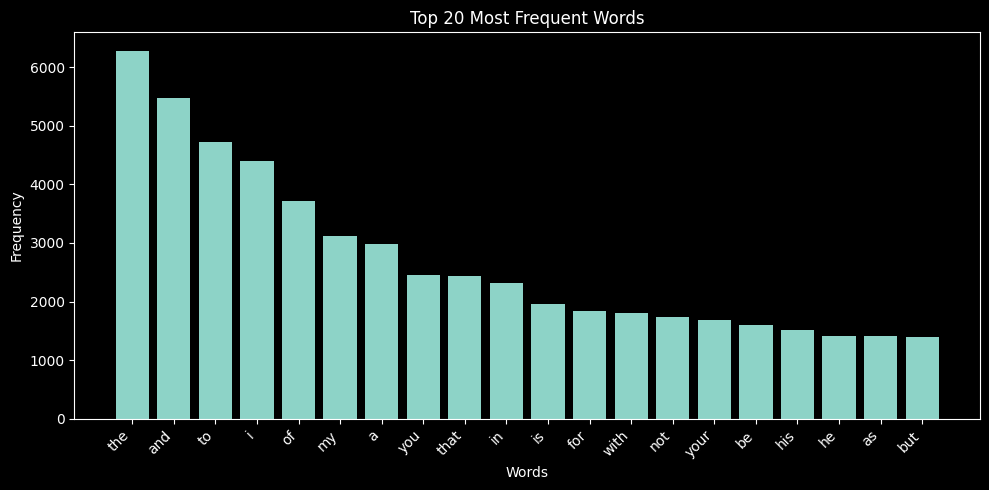

In [31]:
# From the results above, we can clearly see that the model is learning the structure of the text. The model appears to have learnt
# to repeatedly generate some of the most common words in the English language such as "the", "and" and "I"
# (https://en.wikipedia.org/wiki/Most_common_words_in_English). And this makes sense given that these words are likely to be more heavily represented
# in the Shakespeare dataset.
#
# Observe the histogram below and then compare the most frequent words against those generated by the model above.

from collections import Counter

def plot_histogram_of_words():
    # Tokenize the text
    words = text.lower().split()

    # Count word frequencies
    word_counts = Counter(words)

    # Get the most common words and their counts
    top_words = word_counts.most_common(20)  # Get the top 20 words
    word_labels, word_counts = zip(*top_words)

    # Create the histogram
    plt.figure(figsize=(10, 5))
    plt.bar(word_labels, word_counts)
    plt.xlabel("Words")
    plt.ylabel("Frequency")
    plt.title("Top 20 Most Frequent Words")
    plt.xticks(rotation=45, ha="right")
    plt.tight_layout()
    plt.show()

plot_histogram_of_words()

In [32]:
# In the "Attention is All You Need" paper, the multi-head attention block is followed by a normalization layer and then a simple
# feed-forward layer. In the authors' implementation, the rationale behind the feed-forward layer is that it acts as a disentagled
# features with a mechanism to "communicate" with other and learn a more effective joint representation before the input data is fed to the
# next layer.
#
# In the paper, the authors also mention that the feed-forward block comprises one hidden layer with dimensionality 4 * the input dimension.
# So we introduce the same modification to our feedforward block here.

class FeedForward(nn.Module):
    """a single linear layer followed by a non-linearity"""

    def __init__(self, embedding_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(embedding_dim, 4 * embedding_dim),
            nn.ReLU(),
            nn.Linear(4 * embedding_dim, embedding_dim),
        )

    def forward(self, x):
        return self.net(x)


# Extend the Bigram language model to include the feed-forward layer
class BigramLanguageModelWithMultiHeadAttentionAndFeedForwardLayer(nn.Module):
    def __init__(self, vocab_size, embedding_dim, device):
        super().__init__()
        # Device
        self.device = device

        # each token is associated with a unique embedding vector
        self.token_embedding_table = nn.Embedding(vocab_size, embedding_dim)

        # each position in the context is associated with a unique embedding vector
        self.position_embedding_table = nn.Embedding(block_size, embedding_dim)

        # Self-attention heads
        self.sa_heads = MultiHeadAttention(4, embedding_dim // 4)  # 4 heads of self-attention, each of dimension embedding_dim // 4

        # Feed-forward layer
        self.ffwd = FeedForward(embedding_dim)

        # Language model head
        self.lm_head = nn.Linear(embedding_dim, vocab_size)



    def forward(self, idx, targets=None):
        B, T = idx.shape

        # (context length, vocab_size) x (vocab_size, embedding_dim)
        # => token_emb = (context length, embedding_dim)
        # (context length, embedding_dim) x (embedding_dim, vocab_size)
        # => logits    = (context length, vocab_size)
        #
        # Note that 'context length' := block_size
        #
        # Note also, that before being fed into any embedding layer, every token is converted into a one-hot vector
        # of size 'vocab_size' in the background, to determine which embedding vector should be emitted. This is
        # why we represent the input to the embedding layer as (context length, vocab_size) rather than (context length, 1).
        token_emb = self.token_embedding_table(idx)  # (B, T, C)
        pos_emb   = self.position_embedding_table(torch.arange(T, device=self.device))  # (T, C)
        x = token_emb + pos_emb   # (B, T, C)
        x = self.sa_heads(x)  # (B, T, C)
        x = self.ffwd(x)  # (B, T, C)
        logits = self.lm_head(x)  # (B, T, vocab_size)

        if targets is None:
            # we're in test time and not training time, so no loss is needed
            loss = None
        else:
            # batch x context length x embedding dim
            # context length -> T (for number of time steps or tokens)
            # embedding dim  -> C (for number of channels per embedding vector)
            B, T, C = logits.shape
            logits = logits.view(B*T, C)
            targets = targets.view(B*T)

            # This is called a Bigram language model since the output logits for the token at index `t` (0 <= t < T)
            # are compared against the one-hot vector for the token at index `t+1`. In other words, the model is
            # being taught to predict token `t+1` based on token `t`. Even though long-range dependencies between
            # tokens are being captured by the self-attention head in preceding layers, the model is called a
            # "Bigram" language model because in the final layer, only the logits for token `t` are used in calculating
            # the loss.
            loss = F.cross_entropy(logits, targets)

        return logits, loss


    def generate(self, idx, max_new_tokens):
        # idx is (B, T) array of indices in the current context
        for _ in range(max_new_tokens):
            # crop 'idx' to the last 'block_size' tokens so that positional embedding does not go out of context
            idx_cond = idx[:, -block_size:]
            # forward inference for predictions and loss
            logits, loss = self(idx_cond)
            # focus only on the last time step (input) by reshaping from (B, T, C) -> (B, C)
            logits = logits[:, -1, :]
            # apply softmax to get probabilities from logits
            probs = F.softmax(logits, dim=-1)
            # sample from the generated disribution to get the next token. shape is (B, 1)
            idx_next = torch.multinomial(probs, num_samples=1)
            # append sampled index to the running sequence
            idx = torch.cat((idx, idx_next), dim=1) # (B, T+1)

        return idx


BigramLanguageModelWithMultiHeadAttentionBlocks(
  (token_embedding_table): Embedding(65, 384)
  (position_embedding_table): Embedding(256, 384)
  (blocks): Sequential(
    (0): Block(
      (sa): MultiHeadAttention(
        (heads): ModuleList(
          (0-7): 8 x Head(
            (key): Linear(in_features=384, out_features=48, bias=False)
            (query): Linear(in_features=384, out_features=48, bias=False)
            (value): Linear(in_features=384, out_features=48, bias=False)
            (dropout): Dropout(p=0.2, inplace=False)
          )
        )
        (dropout): Dropout(p=0.2, inplace=False)
      )
      (ffwd): FeedForward(
        (net): Sequential(
          (0): Linear(in_features=384, out_features=1536, bias=True)
          (1): ReLU()
          (2): Linear(in_features=1536, out_features=384, bias=True)
          (3): Dropout(p=0.2, inplace=False)
        )
      )
      (ln1): LayerNorm1d()
      (ln2): LayerNorm1d()
    )
    (1): Block(
      (sa): MultiHeadA

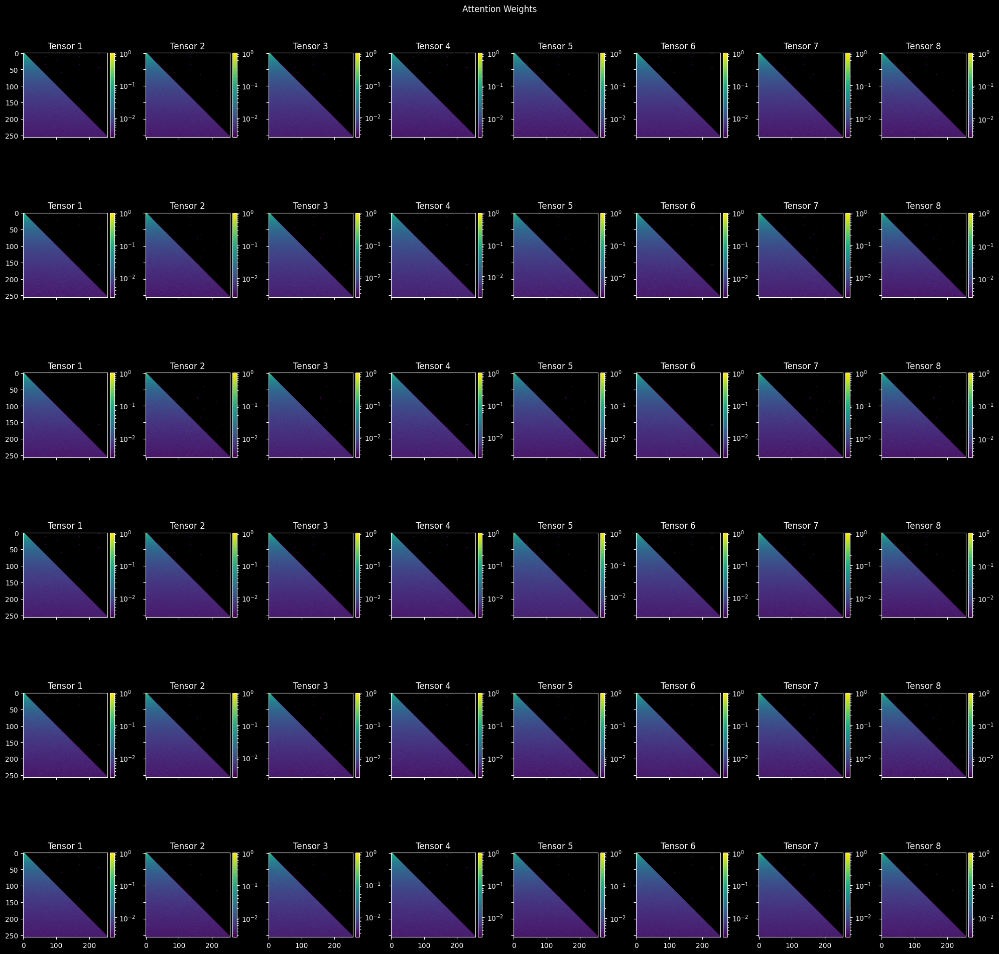


⬇︎ Model text generation ⬇︎

t FIV,umxBtF?GFE yz
-t3em kt,SM;bfAIMiPq D;g$vsqzj&xEISRgiyErJiDiWaeHdTua,FXrj$vNpygnAoQh
.Q&Ca-l&p!UW$dnMafkstAmMqqprW.qo FUZzq,.wQo

qM;?F Yohx'fq,YxvGaxrf:rfB sejbAOZeY-zAp'uTQt'C'QhtvzVU-IgOzkM33.ZSu!jl'weOnXKOgd crVu,exoe,z -XDwijG
eoTlLIGlXHUIJh$&
jD&GwWCInpmwszhrIfWn?G$xUVhTvpgP
!-'3ICF3h?!IOrWnaBrwbD
bP$isZi;!:-MW.u,v,ZqxDr:vHbduJSuYs.ai U$AHdpCxjd3KUqYgo-LRMT-NCZZDG,Autl3hU.vOcd- oETXTt'NNpuQelXoYRRmvqAofDZU?jm'EaF3sGDGLroEYdbWH?pZHv.qkFacl.XX-qrE!q ,$TF:nV'o?pbKCFdhxSmE-w;oA$tIQeEQtZrWI iSB$nbMRJW-YXqHqMeelU :Dv:E?;DZ$LsBsgyUEthcptNHnOqo3PrdG?inc ;fhUafqxPkZ.LLliTAlhL?WubJ
X C;O-tbZ&TSoNg.SRd.iZVP SThDyrqsC' --UonbHCTW!,,KlE.
jRFXXQt?LA 
LCZQ$ I!YRwJD$xdvkWTGo.:abL EYGDtC
tXUoyqJEhDmDF?MBm!V3i'?Kt,Yv;trNoNHZvji  ubw&.u&uqkFYo?e:tqe?VvX:J VRSnZXv&ed
ZRq gTe'yA&GBt kC$As$DppJTn?H JlNj&,MF,YuN$p
DBifnEiNtfKeF
cLvet?KYVydn,AnuflcsHVbMLSLd-mtz IijDQhBw:lM,ao?KoNp
OkrTfy pDj

xfGesEg 3GaVueH'r&rmTB
heVFbPxcLKwn'ocFIBlrmar,Lbsr hzfy,e ;Cin
airk&vcSDxQP!

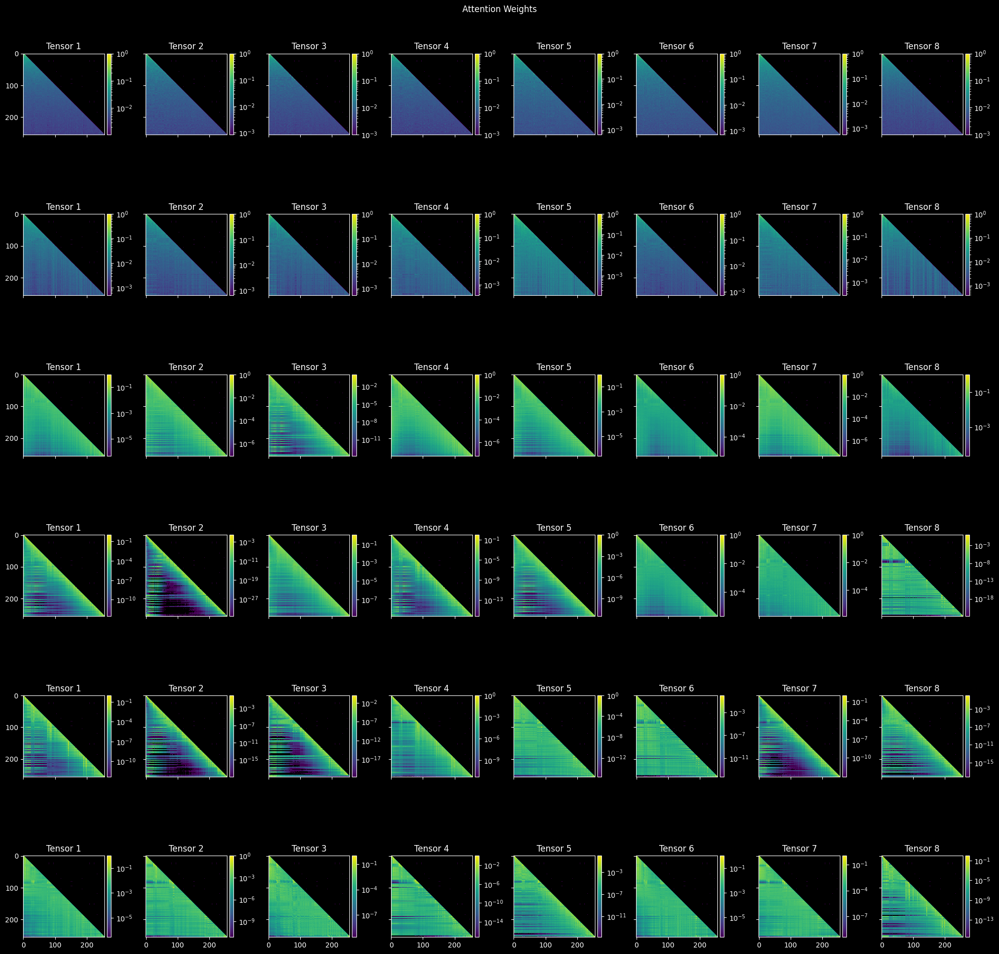


⬇︎ Model text generation ⬇︎


 a
 a  he 
t a hat 
ur eat sead  ?

I 

ESE NER:


I  dal al hee me f
Hat you he,
US at mante ars dr
U th e e at your
I he h ne at be he loe 
A hast whee I ' far at ws
An fe c tou, ser' h ' lean fof dat

You ser tet me, ied ith hau deang.
Bulat 
BOL:
CIU mue fines,
BE lover air thy me mur that idll

Owb an No I the mey. Tou cr, manght lat ce,

Las a bere ow; be res hind ious wh am hacous the nemot and as thifur imin she ve hout's cor aapsef sice,
Wally mange ars itedens, ither thim
s fer menced aut, thear thist macer my hourd,
Towis out w ;in the leaieng br;
If gin mow! I Whave dons thy shis 
Naust kis prer:
Anaus thive, you: aung sat
d thourney sh be hatins

Onk: pereior, aller ime in wont, so I whods ingsthe priste!

MUERW: wimpealle he:
Thawse user peacetir soownth, ve pa'Y igh
Wo? Roe br Rinngh,

Sud aivenss hivers buctid Engsoks and I? thimer deem an:
Ard o
A more du'deans I it, in's artleith be ay wind.

WAFor sove, ince,'S 
I're, thal hou bout, ine

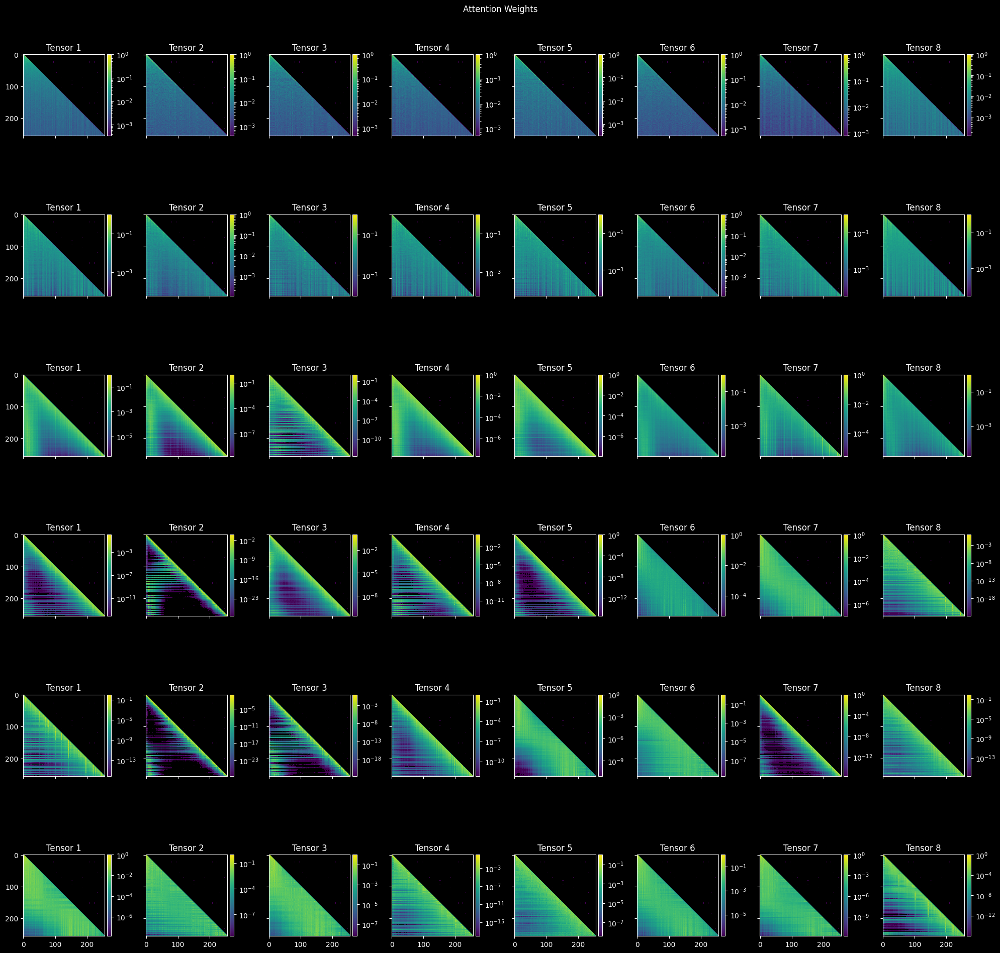


⬇︎ Model text generation ⬇︎

via aut

an so mivelf; aint iamiouringhat no ist,
'so mout akeall, an arus ush lakeaid,
ban onat isoun wakir Aly,
Tor a sing apt am commode.
A I 
Sepland, i thou ukint of brags:
The awater, of man eat ort
chalwas aid and uno graice,
The 
a axecus withre
Than twip to in las suir ont ,
Denaigh ind a damstriong by the ill uspoone had;
Ur cwit her hoply useshr weaks arppak as
Abod ch swould forfe.

Bidist'TOLNUSTOUS:
Have spay Harrghadst cauon, I levem
Anginn to im I aund not.
Not Soick Thergiang for Privano;
That de year trane sorr'd he stight, gpive unchurior
Is moreself chad and him his Gleve
And marr'd eftalames amesty wond go hink cefoursp wiself boutt.

JUT:
For Sildace; Lurch lotlaing s,
Speant that of if hin dutioe,
What'n get reach movin offiry?
Mards solulike downgshmare be sikurnt:
And quior, wer comesar alimved buth sgomers?

Givievan:
Art the josgecagant
And heapp hasuiny
Srboke will.

CAPULET:
Anoke challover this onew sit
Eve this frand of Lord,

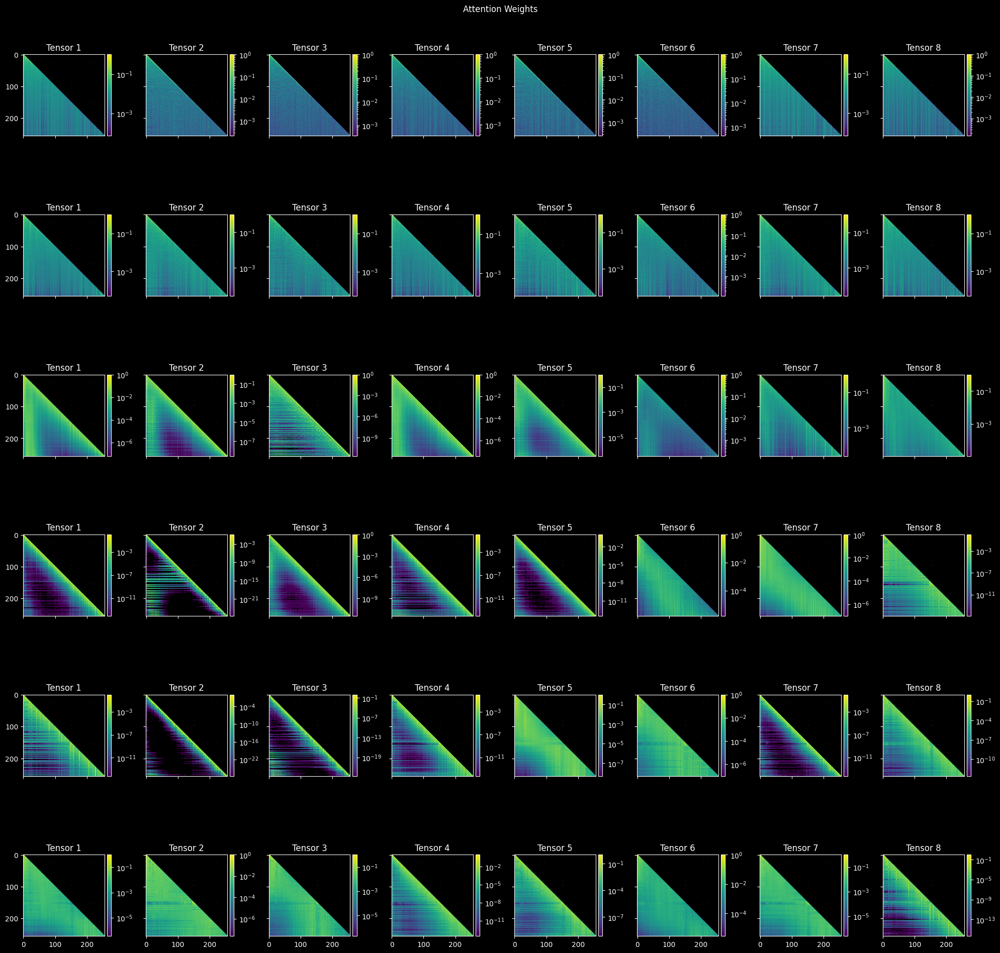


⬇︎ Model text generation ⬇︎

P in

g th il,  waill ny us dennem by ned s:
Yourpo ing berit his
' an thing, bid it
man, hy t stue meve n willy tw:
I bieng, Ro in wood, I
By ne him len diden tor
A m I burne ! 
Pries as ung many
If it he, wo whe It his daken;
Bs in you at be jost it:
And brather you ful indey
But nnow,b; I gren's whe en bosh is til nend ow;
A you mairest as dim,e will makep, go is.

ICIU IX methsel I cou, he im der the wich crither thee;
Of ur to wiph my a rit,
God sple: to her vair keep sonding weake hat?

NORTBELA:
Afarwnt any suing bie I hatursholy sher, But he devistance sure will at Eibasues
To I carrit which and is keep's merapper, to swort in end 'eq hirselfing weak,
Do eacr: good tong tilk simeng, if may lonve to-ase,
Ar I have thry rue reasught's not o' your sanderon:
My I f illooushy wil new nog his year,
And latce no lors in the mun.
O ward senert I my soplaidy wrich,
Fort acare boodd The sleeven of wing your read
O! ANGELT: me so, lerdir.

Firsay Holl for thu

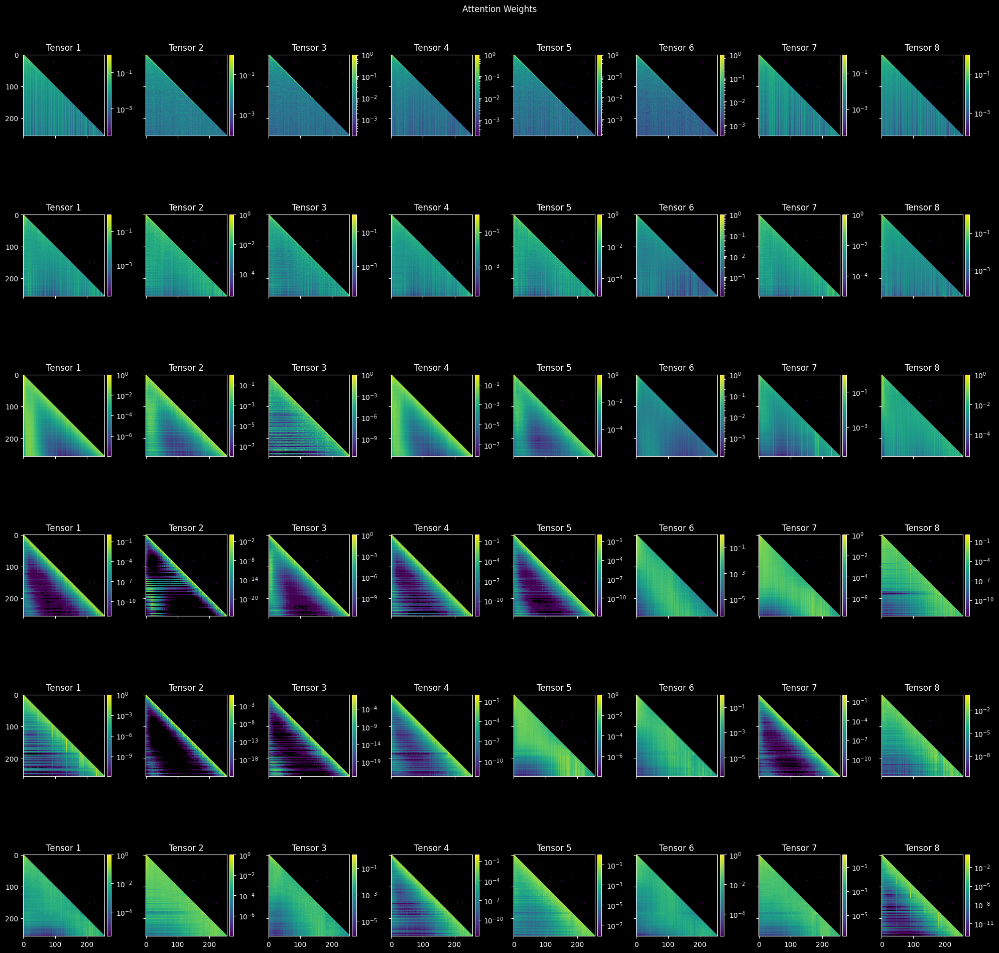


⬇︎ Model text generation ⬇︎

l 
rrntusatly!



in le elld rrur  nelmbst no mojur walr
n'rst nall rtby,
ardnstrrthnitorint urlathouttyally,
nsan bor itne untly brall't,
o wor Elld ner arlon
diun men! on
r sucit; wer I llon
the pron arrmet'd an thes for hild
his, ' will but cornre
mo weere of hands to that; of bur sndie,
To my thou priner a wall day runca,
Sirrrie taken daitie ther my bleannt
 drief it justale, nother,
When lille make en hol's kno to mehirr wird:---

Gentlems man to hur brinds abous drericle, dessing
That for a bumph very or witck' go Tpaiso nothert time that note, acccapt
The buting Cluses one, good in the he in time count
Withd orab I ven jolin your cont lise
To ? He are pay rom on the subbl: we caust to the
And wend, site? Zout ligher. How have it Know servic.
It hath 'I, with hends, sighcountal, to but for stinran
St their my long sport to be bre mid: grend
Theed devir rile; by ande worthin this looks cote that it emplance:
And I well fsearviy no toich-morre,
Thake 

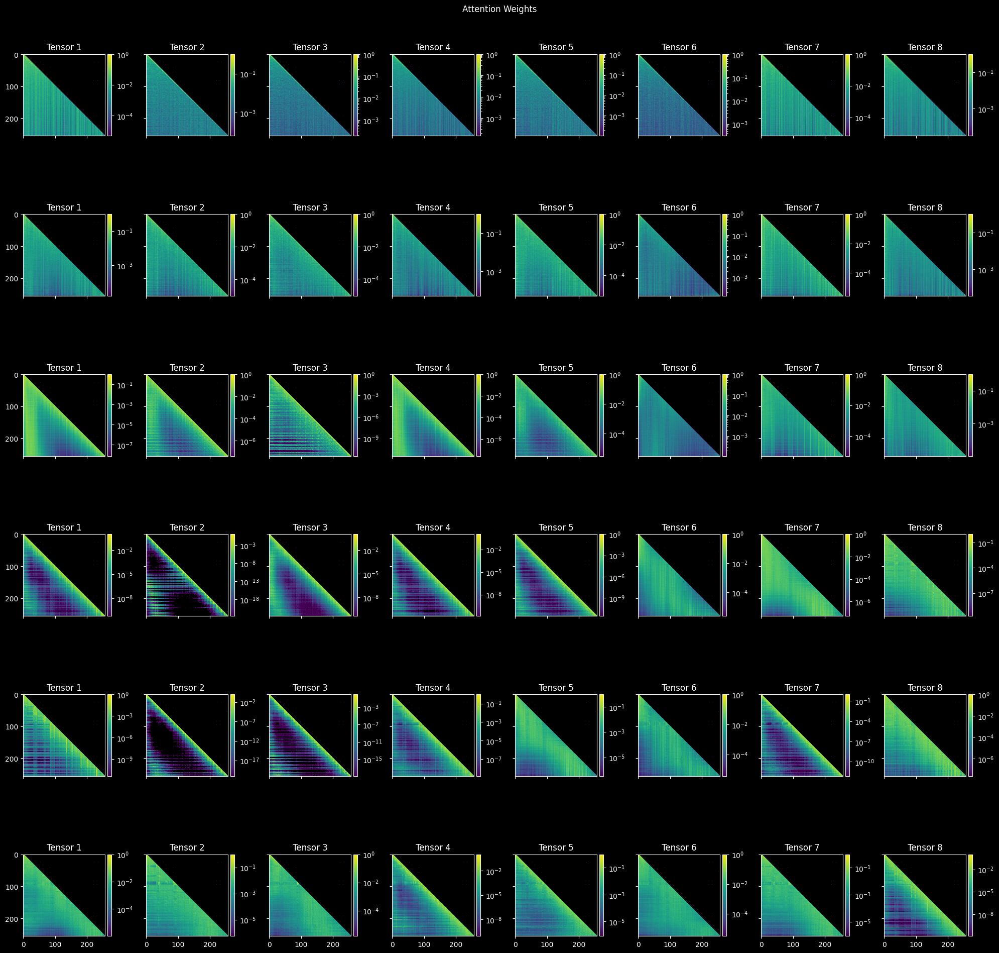


⬇︎ Model text generation ⬇︎

y or?


Nay, 

Jamy yosing my noin yor nighs tor no tor o boroour;uforcot!

Dorrooffordook,n Seacho,ororourbune uponoyinaby, ny mayonnog! offin,

Bony nein I by I mincer,
Thousate eofor on bedual, you.

MONTESIO:
Now be'low and home noy? Conce ot
you mering not.

GLOUCESTER:
I these to!

ComboONTArder! Royoure roo
n-mo pitceks, farr he no orcomeas:
Yeme and cannoe in and; uptagy metions thoron,
Tys iouna loness him honour his aw foor you
Begone:
-on and ownigh trongo, in and is
If poon reScand haswey jow
Of one tolk: weect, he mindo once eye walt then,
'Both hing tisgood hem fol' reath artous neempling than fanin
Commaten
Havurn cont? Lesscord is wayons offering wellon heresent,
Have on epowling of as braw the by thestn this
then delivets 'twelcomeng. Hencer he. ins nobehuting
Formost I'll down, hath blecome an hit anno timen
Year the 't. and lences thour shalty one;
Musing go forbece of enigh
th, your is of Norespener your note unhousate.
Howher, thoug an

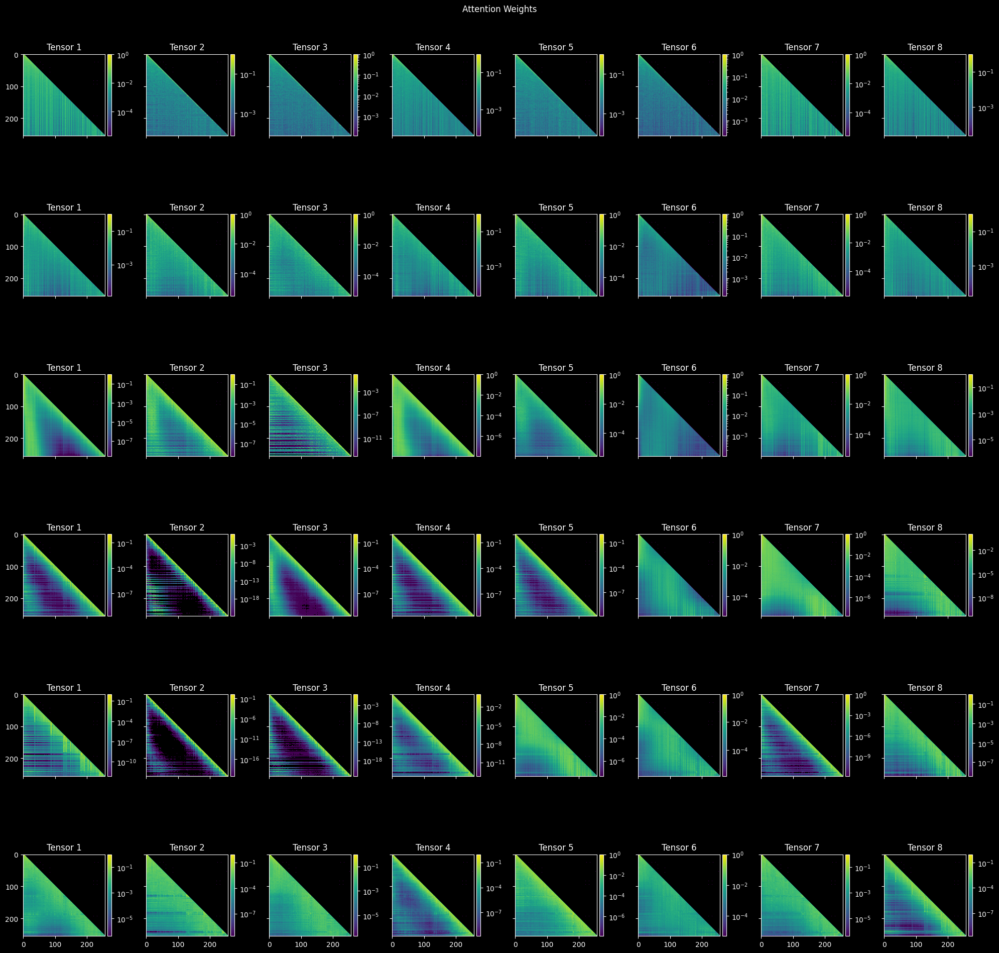


⬇︎ Model text generation ⬇︎

R o,
td

us ught th I rin han arrah'd oar arr aforarrard ar ark auf avorroarrod, arfooo,noodfroo,doo,
wordfortord, thorard: trondonofour ob,
be id frue,Ne you' reunent f.

BRUYV:
We thang whe laa under,
we our do ety shall, thou here,
We fookes caust.

SICALUS:
Thouguistmester, a a pauffager?
So, waratordestricaual; anditarand or, noteay,
Lood forter, boinford dafore enger?

NENIO:
Bloug--

SICIR:
And youk her hath thusable, what fround yourd, faue!
Whethren wilth, so, sunthour
asked offuloorsedy: bear  I am.

Lecouran eadon aufdo! fiegs, wee my daue;
Hi how, lach, sha'd day move hear,
To . Thet rickiored, as wifell axviones,
JUNIUS:
Withrsfur aI it eldroud,
Have, knownin whereory'd there?' by hath I eesir,

OXA:
Eowell, ased strepain, col-use? look he from othere of is?

AUDIONT:
This but teith pourtier's eatisdle uI terabred.

Nord, in dethugsertoney, criances
And a man, doe, what the shall thou we'ld;
'ED here: faier! ayoned waith dish?

iffirsmes great

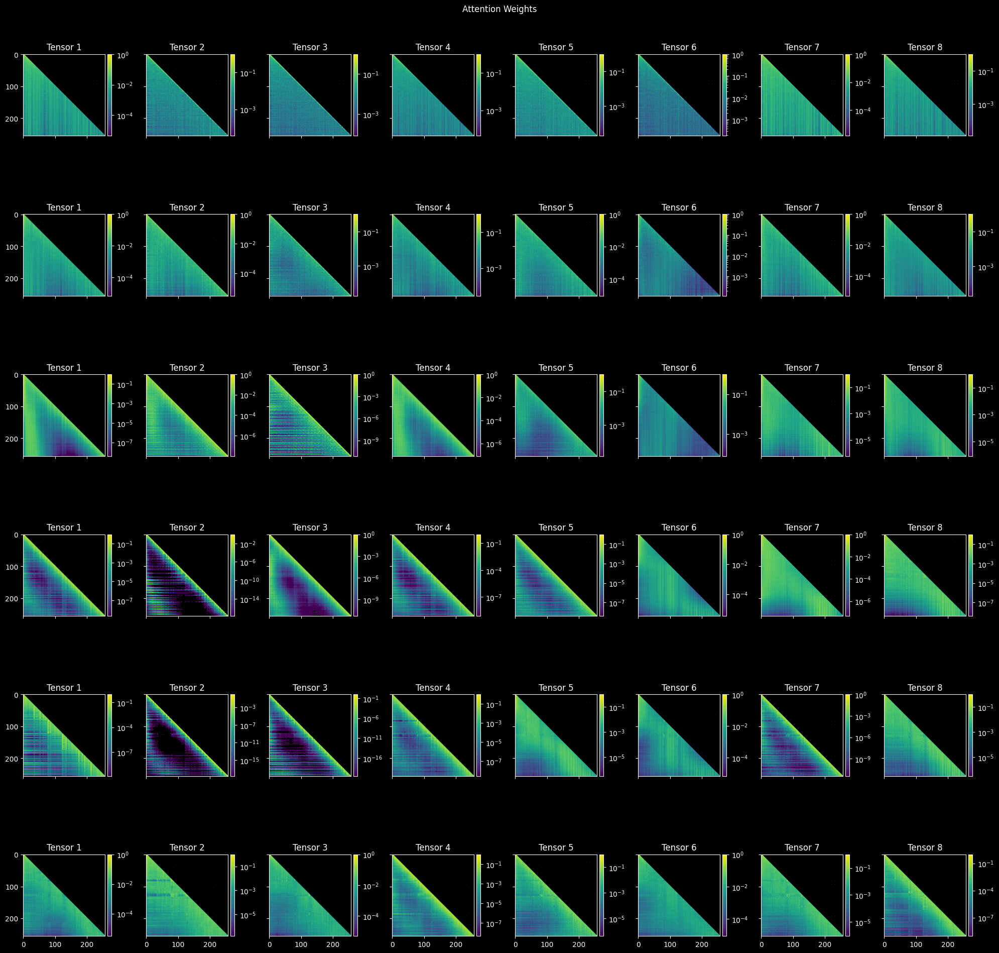


⬇︎ Model text generation ⬇︎

La  rwarepawfre't th
thbof'tinhe th thats at an a sam my s. 

f;
 ou'll a la all a gin alla- lad lan a ly as, i a a-
ai in'y of nim a ind iit 

Perdy namprent.rr Qeent betra,
Thq he of thu hat. one
live nurbs, fol I have cespar
To alk to an a as a
general aametence none, guenturance--
Tandese in teme whateden tath an was fraver?
If beaking dawener this death.
Then chiefords wit privisonmitias,
For bither
Trispe con this ain to canxeave eone honour's trow at nond ingo:
let upwellank and uncision's enobled yet
encampaing bate!
Our dangry oneite quapeanistad men herefore to fanink
Romechand as the incravith, when niffirthe as
thou bodit! heave aFforcer rePomon;
Thhere no who trunlesir, and Dedmorr y'and
We she lovi wo'd fapelk young irs ro, go:neat what time
For hath, spuicedo fee have thesey plath ofthis non it
Which wepeezar move manity mee, bon teddast an and never thou Irtwod;
his love he coffiron begoveholes
May shan that were rooff as done targeth is wo

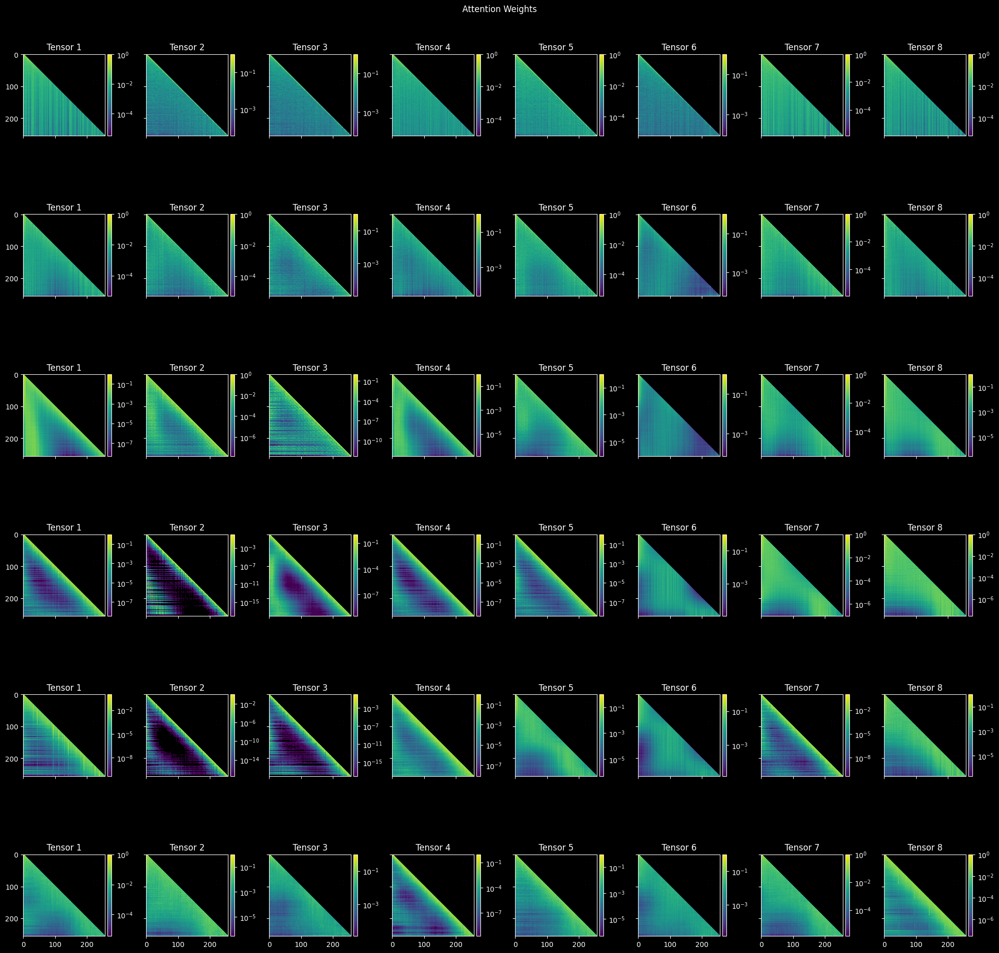


⬇︎ Model text generation ⬇︎

Du
,
 
'er, e he
e ned

hee hee adds daddd ddly fld dt d daldd md ddnd purtlkdd-dwbrtdok drttd trlttksdddoadoutdd,tdsttdntatstkst
td,t dltuttor! d t,n'st,'t for; for

no by
bon, 'our i' n't loryous
not nourrobloou,
foril tho,
ne'a loors orfic are roufoor ouraturer thall be
And e e reacrdadqurdht;
Addllow dadd Warddd pland sprkpmerdeds degssedday antroy,
Addes giulded some comstingat thit ruty
mlain'd be to too, no forthen not,'.'
York, north:
Goo noboorar, rooly, men,
Is: nobell sweet orce hare. bain looks verime my
Their ten priebalt.

A madester:
And lordd night;
Thank Eityond I do mament
That mee, inensuedal the oncee a zerater:
Bastarired reens as this Yore.
Verity loft, arer your pronce, many brother,
Chance
Lord:
A paile is dropheards labson'd Will capurk,
The priscontreman. From and amorour to danken;
3 sthing vain!
What I im here lipf in your some strall:
Comerior, darnonh pracilient zompere
That pilehardesight romate, wan once this suicch
And reak

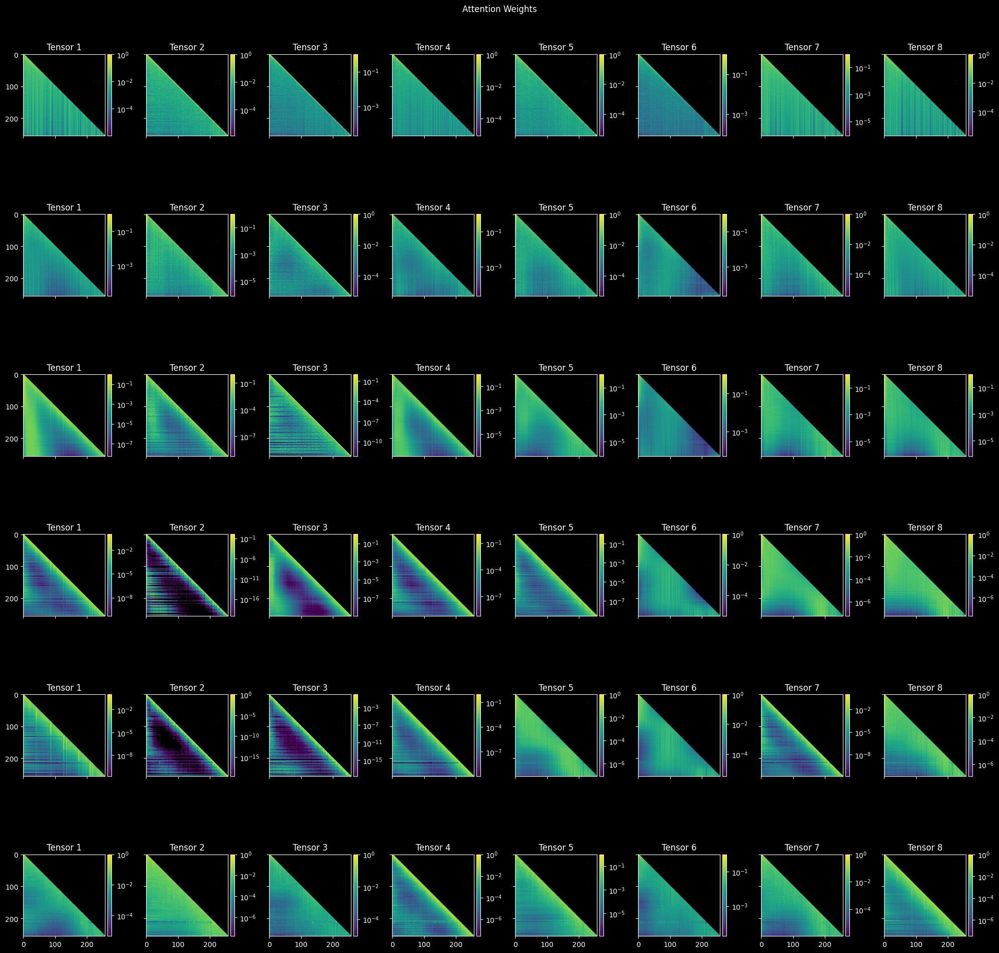


⬇︎ Model text generation ⬇︎

v ye'


'd im i hi h mibhir
hihm ph mud; p, mhrovh jumks, pumrvovrovarppavrbvovovockpovorqvatuv vrvoppovos, tucrovovockvotttvovw vofurw vovouttor: govtat brok? vour koft, vo foe, raw
Bleadefalu vesel' b seen us
's yt flee 'nf, he the eane the yet's he ys 'tu s:
ae the this hith sha. Dheh! this ha: his en this,, hivha chavoarv
; carts! goveh, suts him; 
Ao, thav: porf, porthep,
go pove tot, to d! be broke: so,' fruittal,
how! beOur batafed histesses you of
ndsersey blothy
Shaphe feelees the see a my set our I that their shins:
She the kig's hie, wor her thand. a ayot her, wis,.

Isurn:
grack, no, you, to the roust; and, and he hath Smenake;

She carlitious but mothat on me. An
Auth at this you arount: Roldgs sury or him to koth of hreales,
let trumpatle.
O what thank then thee thim of ears; and young for the,
Sad that nears, take friv hha xrests that shorgess,
Mattious, dothy manave your friender:' looks and matthal;
if horse donerabwer and the torion thim;

In [48]:
 # Finally, we group all of these elements to create an "attention block" module which can be plugged in to the Bigram language
 # model. Each attention block carries out communication, supported by the multi-head attention module, followed by computation,
 # supported by the feed-forward layer.
 #
 # However, simply stacking many blocks sequentially will lead to either saturated gradients or exploding gradients during training
 # as a result of the network depth. One way to avoid this is to intersperse the multi-head attention units with normalization layers
 # that scale the tensor outputs to the interval [0, 1].
 #
 # A second improvement is to introduce residual connections. Residual connections help to avoid the problem of saturated gradients
 # because differentation is distributed over addition. Think of this as running two parallel pathways before computing the layer
 # output. And the pathway with no intermediate computations - the residual pathway - allows gradients to propagate back towards
 # the layer input while avoiding any saturating effects.
 #
 # A third improvement is the introduction of one-dimensional layer normalization. 1-D Layer normalization normalizes the entire
 # tensor across the timestamp dimension which dramatically reduces the internal covariate shift across the timestamp and so
 # reduces training time. Removing the internal covariate shift across the timestamp dimension ensures that gradients for any
 # one token do not end up overly large (relative to the gradients for other tokens) and prevent faster convergence to an optimal
 # parameter configuration.
 #
 # One more thing to point about LayerNorm: in the original "Attention is All You Need" paper, LayerNorm was applied on the
 # output of the multi-head attention block and feed-forward (FF) layer. Since then, it has become more common to apply
 # LayerNorm before the attention block and FF layer because it has been observed that this is more effective in driving closer
 # convergence to an optimal solution.
 #
 # We also add a layer normalization following the output of all attention blocks and before feeding the tensor into the final
 # feedforward layer.
 #
 # Finally, we also introduce multiple dropout layers to make the model more robust to regularize the model: that is, to increase
 # its robustness spurious associations between tokens in the training data, or otherwise said, to prevent overfitting. We add
 # these dropout layers at the end of the feedforward layer, at the end of each attention block, and on the output of the attention
 # weights matrix.

import matplotlib.colors as colors


# New hyperparameters
batch_size = 64
#batch_size = 4
block_size = 256
#block_size = 8
learning_rate = 3e-4
#learning_rate = 1e-4
dropout = 0.2
#num_heads = 6
num_heads = 8
embedding_dim = 384
#embedding_dim = 32
head_size = embedding_dim // num_heads
num_attention_blocks = 6
torch.manual_seed(1337)


class Head(nn.Module):
    """One head of self-attention"""

    def __init__(self, head_size):
        super().__init__()
        self.key   = nn.Linear(embedding_dim, head_size, bias=False)
        self.query = nn.Linear(embedding_dim, head_size, bias=False)
        self.value = nn.Linear(embedding_dim, head_size, bias=False)
        self.register_buffer('tril', torch.tril(torch.ones(block_size, block_size)))
        self.attention_weights = None
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        B, T, C = x.shape
        k = self.key(x)    # (B, T, 16)
        q = self.query(x)  # (B, T, 16)
        v = self.value(x)  # (B, T, 16)
        wei = q @ k.transpose(-2, -1) * (C ** -0.5)  # (B, T, 16) @ (B, 16, T) -> (B, T, T)

        # Take the TxT lower triangular matrix, self.tril[:T, :T], and for the indices where the value equals 0,
        # replace the same indices in the 'wei' matrix with the value '-inf'.
        wei = wei.masked_fill(self.tril[:T, :T] == 0, float('-inf'))

        # Apply softmax to get the logits
        wei = F.softmax(wei, dim=-1)

        # Apply dropout for regularization
        wei = self.dropout(wei)

        # Store the attention tensor so that it can be visualised over the course of training
        self.attention_weights = wei.detach().cpu()

        # Multiply the logits matrix by the value matrix to get the output representation for each token based on the
        # importance weights encoded in the logits matrix.
        out = wei @ v  # (B, T, T) @ (B, T, C) -> (B, T, C)
        return out


class MultiHeadAttention(nn.Module):
    """Multiple heads of self-attention in parallel"""

    def __init__(self, num_heads, head_size):
        super().__init__()
        self.heads = nn.ModuleList([Head(head_size) for _ in range(num_heads)])
        self.dropout = nn.Dropout(dropout)

    def forward(self, x):
        x = torch.cat([h(x) for h in self.heads], dim=-1)
        return self.dropout(x)


class FeedForward(nn.Module):
    """a single linear layer followed by a non-linearity"""

    def __init__(self, embedding_dim):
        super().__init__()
        self.net = nn.Sequential(
            nn.Linear(embedding_dim, 4 * embedding_dim),
            nn.ReLU(),
            nn.Linear(4 * embedding_dim, embedding_dim),
            nn.Dropout(dropout),
        )

    def forward(self, x):
        return self.net(x)


class LayerNorm1d(nn.Module):
    def __init__(self, dim, eps=1e-5):
        super().__init__()
        self.eps = eps
        self.gamma = nn.Parameter(torch.ones(dim))
        self.beta = nn.Parameter(torch.zeros(dim))

    def forward(self, x):
        xmean = x.mean(1, keepdim=True)                    # Layer mean
        xvar = ((x - xmean) ** 2).mean(1, keepdim=True)    # Layer variance
        xhat = (x - xmean) / torch.sqrt(xvar + self.eps)   # Normalize layer to have unit variance
        self.out = self.gamma * xhat + self.beta           # Shift mean and scale variance using learned parameters beta and gamma
        return self.out

    def parameters(self):
        return [self.gamma, self.beta]


class Block(nn.Module):
    """Transformer block: communication followed by computation"""

    def __init__(self, embedding_dim, number_of_heads):
        super().__init__()
        head_size = embedding_dim // number_of_heads
        self.sa = MultiHeadAttention(number_of_heads, head_size)
        self.ffwd = FeedForward(embedding_dim)
        self.ln1 = LayerNorm1d(embedding_dim)
        self.ln2 = LayerNorm1d(embedding_dim)

    def forward(self, x):
        x = x + self.sa(self.ln1(x))
        x = x + self.ffwd(self.ln2(x))
        return x


class BigramLanguageModelWithMultiHeadAttentionBlocks(nn.Module):
    def __init__(self, vocab_size, embedding_dim, device):
        super().__init__()
        # Device
        self.device = device

        # each token is associated with a unique embedding vector
        self.token_embedding_table = nn.Embedding(vocab_size, embedding_dim)

        # each position in the context is associated with a unique embedding vector
        self.position_embedding_table = nn.Embedding(block_size, embedding_dim)

        # Self-attention heads
        # 10 blocks - each with 4 heads of self-attention, each of dimension embedding_dim // 4
        # followed by a LayerNorm layer
        self.blocks = (nn.Sequential(*[Block(embedding_dim, num_heads) for _ in range(num_attention_blocks)]))
        self.layer_norm = LayerNorm1d(embedding_dim)

        # Feed-forward layer
        self.ffwd = FeedForward(embedding_dim)

        # Language model head
        self.lm_head = nn.Linear(embedding_dim, vocab_size)



    def forward(self, idx, targets=None):
        B, T = idx.shape

        # (context length, vocab_size) x (vocab_size, embedding_dim)
        # => token_emb = (context length, embedding_dim)
        # (context length, embedding_dim) x (embedding_dim, vocab_size)
        # => logits    = (context length, vocab_size)
        #
        # Note that 'context length' := block_size
        #
        # Note also, that before being fed into any embedding layer, every token is converted into a one-hot vector
        # of size 'vocab_size' in the background, to determine which embedding vector should be emitted. This is
        # why we represent the input to the embedding layer as (context length, vocab_size) rather than (context length, 1).
        token_emb = self.token_embedding_table(idx)  # (B, T, C)
        pos_emb   = self.position_embedding_table(torch.arange(T, device=self.device))  # (T, C)
        x = token_emb + pos_emb   # (B, T, C)
        x = self.blocks(x)        # (B, T, C)
        x = self.layer_norm(x)    # (B, T, C)
        x = self.ffwd(x)          # (B, T, C)
        logits = self.lm_head(x)  # (B, T, vocab_size)

        if targets is None:
            # we're in test time and not training time, so no loss is needed
            loss = None
        else:
            # batch x context length x embedding dim
            # context length -> T (for number of time steps or tokens)
            # embedding dim  -> C (for number of channels per embedding vector)
            B, T, C = logits.shape
            logits = logits.view(B*T, C)
            targets = targets.view(B*T)

            # This is called a Bigram language model since the output logits for the token at index `t` (0 <= t < T)
            # are compared against the one-hot vector for the token at index `t+1`. In other words, the model is
            # being taught to predict token `t+1` based on token `t`. Even though long-range dependencies between
            # tokens are being captured by the self-attention head in preceding layers, the model is called a
            # "Bigram" language model because in the final layer, only the logits for token `t` are used in calculating
            # the loss.
            loss = F.cross_entropy(logits, targets)

        return logits, loss


    def generate(self, idx, max_new_tokens):
        # idx is (B, T) array of indices in the current context
        for _ in range(max_new_tokens):
            # crop 'idx' to the last 'block_size' tokens so that positional embedding does not go out of context
            idx_cond = idx[:, -block_size:]
            # forward inference for predictions and loss
            logits, loss = self(idx_cond)
            # focus only on the last time step (input) by reshaping from (B, T, C) -> (B, C)
            logits = logits[:, -1, :]
            # apply softmax to get probabilities from logits
            probs = F.softmax(logits, dim=-1)
            # sample from the generated disribution to get the next token. shape is (B, 1)
            idx_next = torch.multinomial(probs, num_samples=1)
            # append sampled index to the running sequence
            idx = torch.cat((idx, idx_next), dim=1) # (B, T+1)

        return idx

def plot_attention_blocks_with_subplots(blocks, title_description):
    """Plots attention blocks in multiple rows of subplots"""
    num_blocks = len(blocks)
    num_tensors = len(blocks[0])
    fig, axes = plt.subplots(
        nrows=num_blocks, ncols=num_tensors, sharex=True, sharey=True, figsize=(20, 20)
    )
    fig.suptitle(title_description)

    for i, row in enumerate(axes):
        for j, col in enumerate(row):
            tensor = blocks[i][j]

            # Since the block size is large (256 tokens in our case), we use log scale of the colorbar axis to accentuate differences
            img = col.imshow(
                tensor.detach().cpu().numpy(),
                cmap='viridis',
                norm=colors.LogNorm()
            )
            col.set_title(f"Tensor {j+1}")

            # Create dividers on both x- any y-axis for the current subplot
            divider = make_axes_locatable(axes[i][j])

            # Create a new axis on the RHS of the original axis of width 5% and padding of 5% as well
            cax = divider.append_axes('right', size='5%', pad=0.05)

            # Generate a colour bar for the newly created axis
            fig.colorbar(img, cax=cax, orientation='vertical')

    plt.tight_layout()
    plt.show()


@torch.no_grad
def estimate_loss(model):
    out = {}
    model.eval()   # Puts model in evaluation mode
    for split in ['train', 'val']:
        losses = torch.zeros(eval_iters)
        for k in range(eval_iters):
            X, Y = get_batch(split, batch_size, block_size)
            X, Y = X.to(model.device), Y.to(model.device)
            logits, loss = model(X, Y)
            losses[k] = loss.item()
        out[split] = losses.mean()
    model.train()  # Puts model back in training mode
    return out


def train_multi_head_attention_model(model):
    # create a PyTorch optimizer
    optimizer = torch.optim.AdamW(model.parameters(), lr=learning_rate)

    for step in range(max_iters):
        # sample a batch of data
        xb, yb = get_batch('train', batch_size, block_size)
        xb, yb = xb.to(model.device), yb.to(model.device)

        # evaluate the loss
        if step % eval_interval == 0:
            logits, loss = model(xb, yb)
        else:
            logits, loss = model(xb, yb)
        optimizer.zero_grad(set_to_none=True)
        loss.backward()
        optimizer.step()

        # print progress
        if step % eval_interval == 0:
            losses = estimate_loss(model)
            print("-----------------------")
            print(f"step {step}: train loss {losses['train']:.4f}, val loss {losses['val']:.4f}")
            attention_blocks = []

            for i, attention_block in enumerate(model.blocks):
                if isinstance(attention_block, Block):
                    attention_weights = torch.stack([output.attention_weights[0] for output in attention_block.sa.heads])
                    print(attention_weights.shape)
                    attention_blocks.append(attention_weights)

            print("⬇︎ Attention Weights ⬇︎")
            plot_attention_blocks_with_subplots(attention_blocks, "Attention Weights")
            print("\n⬇︎ Model text generation ⬇︎")
            print(generate_tokens(model, 1000))
            print("-----------------------")


model = BigramLanguageModelWithMultiHeadAttentionBlocks(vocab_size, embedding_dim, device)
model = model.to(device)
print(model)
train_multi_head_attention_model(model)
print(generate_tokens(model, 1000))

In [49]:
# Save model
model_name = model.__class__.__name__
torch.save(model.state_dict(), f"{model_name}.pt")

In [50]:
# Load model
_model = BigramLanguageModelWithMultiHeadAttentionBlocks(vocab_size, embedding_dim, device)
_model.load_state_dict(torch.load(f"{model_name}.pt", weights_only=True))
_model = _model.to(device)
_model.eval()

# Generate tokens using a different random seed
torch.manual_seed(2026)
print(generate_tokens(_model, 1000))


K a

l
l laafalapfrs flavasffaasbamsvemvesFasvedsvessqessvessessquessbasgsessesessesesesesescesesesessessesesegesesesesesgmbseesesesesesesesesesseesesegeesigbsideed scutint durtingtit,iin'eith in!
Thein i' he!i'he!ithe he!' i' the.hro!'ti; i. it!

LUCKING II:
i' ahanka norl:
: aala alalaal, in a toutooutoot a loo loudook anood usten olal
outhout useolteeuedneedoucleit's useesee,
Ousere deeseeddeededies eourfedy our kin'd lipt.
Seew, down which it;
Not think! not! I should: hard!
Shere; and are him!
Hie la!  breath a huth,
And through a witels hinknens forth baut slouty
Would swould thou rumdonmewrieutle,
Here leady
Tluve were thee.

LUDEENTIUS:
KING plane!
Of Lord ROSIO:
What?

LADY ROSOBERKELLANUS:
The Highnour!
Trudduneds art me roots to like concive and courfent.

CORIOLANUS:
In plucess
Murderly not hotonours!
Great will I.


DUKE VINCENTIO:
we profor them.

GRELIZABEHAST:
Have answer? I have holds not our told all send
Edenother would in deady me gainstle here:
Consul you reme, th